In [1]:
import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import pandas as pd 
import random 
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
import os
import nibabel as nb
from torch.utils.data import Dataset
from PIL import Image


In [2]:
class JpegClusteringProcessedDataset(Dataset):
    
    def __init__(self, csv_file):
        
        data_info = pd.read_csv(csv_file)
        self.image_path = []
        self.seriesIdentifier = []
        
        for index, row in data_info.iterrows():
            if row['frame_num'] == 128: ### based on the distribution of the images, decision has been made
                self.image_path.append(row['preprocessed_2_path_jpeg'])
                self.seriesIdentifier.append(row['seriesIdentifier'])

    def __len__(self):
        return len(self.image_path)

    def __getitem__(self, idx):
        
        img = np.asarray(Image.open(self.image_path[idx]))
        img = self.padding_to_ideal_shape(img)
        img = self.intensity_normalization(img)  
        
        
        img = torch.from_numpy(img)
        img = torch.unsqueeze(img, 0)
        return {'image': img, 'image_path': self.image_path[idx], 'seriesIdentifier': self.seriesIdentifier[idx]}
    
    def intensity_normalization(self, raw):
        return (raw - np.mean(raw)) / np.std(raw)
    
    def padding_to_ideal_shape(self, img, ideal_shape=(256, 256)):
        img_shape = img.shape
        i_shape = int((256 - img_shape[0])/2.0)
        j_shape = int((256 - img_shape[1])/2.0)
        marginal_zero = np.zeros(ideal_shape)
        marginal_zero[i_shape:i_shape+img_shape[0], j_shape:j_shape+img_shape[1]] = img
        return marginal_zero[2:-2, 2:-2]


In [3]:
start_dim = 8

class Encoder(nn.Module):
    
    def __init__(self, encoded_space_dim):
        super().__init__()
        
        ### Convolutional section
        #in_c, out_c, kernel_size
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(1, start_dim, 3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(start_dim),
            nn.Conv2d(start_dim, start_dim, 3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(start_dim),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(start_dim, start_dim * 2, 3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(start_dim * 2),
            nn.Conv2d(start_dim * 2, start_dim * 2, 3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(start_dim * 2),
            nn.MaxPool2d((2, 2)),
            nn.Conv2d(start_dim * 2, start_dim * 4, 3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(start_dim * 4),
            nn.Conv2d(start_dim * 4, start_dim * 4, 3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(start_dim * 4),
        )
        
        ### Flatten layer
#         self.flatten = nn.Flatten(start_dim=1)
# ### Linear section
#         self.encoder_lin = nn.Sequential(
#             nn.Linear(31 * 31 * 128, encoded_space_dim),
#         )
        
    def forward(self, x):
        x = self.encoder_cnn(x)
#         x = self.flatten(x)
#         x = self.encoder_lin(x)
        return x


class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim):
        super().__init__()
#         self.decoder_lin = nn.Sequential(
#             nn.Linear(encoded_space_dim, 63 * 63 * 64),
#             nn.ReLU(True)
#         )

#         self.unflatten = nn.Unflatten(dim=1, 
#         unflattened_size=(64, 63, 63))

        self.decoder_conv = nn.Sequential(
            nn.Conv2d(start_dim * 4, start_dim * 2, 3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(start_dim * 2),
            nn.Conv2d(start_dim * 2, start_dim * 2, 3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(start_dim * 2),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(start_dim * 2, start_dim, 3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(start_dim),
            nn.Conv2d(start_dim, start_dim, 3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(start_dim),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(start_dim, 1, 3, stride=1, padding=1)
        )
        
    def forward(self, x):
#         x = self.decoder_lin(x)
#         x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [4]:
batch_size = 8
jpeg_csv_path = '/w/246/gzk/PPMI/codes/T1_PD_clustring.csv'


In [5]:
dataset = JpegClusteringProcessedDataset(jpeg_csv_path)

data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size)

In [6]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr= 0.001

### Initialize the two networks
d = 32 * 32

#model = Autoencoder(encoded_space_dim=encoded_space_dim)
encoder = Encoder(encoded_space_dim=d)
decoder = Decoder(encoded_space_dim=d)
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

Selected device: cuda


Decoder(
  (decoder_conv): Sequential(
    (0): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Upsample(scale_factor=2.0, mode=nearest)
    (7): Conv2d(16, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): Upsample(scale_factor=2.0, mode=nearest)
    (14): Conv2d(8, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
)

In [7]:
### Training function
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer,noise_factor=0.3):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for data in dataloader:
        image_batch = data['image'].to(device, dtype=torch.float)
        # Encode data
        encoded_data = encoder(image_batch)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
#         print(image_batch.shape)
#         print(decoded_data.shape)
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
#         print('\t partial train loss (single batch): %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [8]:
### Testing function
def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for data in dataloader:
            image_batch = data['image'].to(device, dtype=torch.float)
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [9]:
def plot_ae_outputs(encoder,decoder,n=5):
    plt.figure(figsize=(10,4.5))
    for i in range(n):
        ax = plt.subplot(2,n,i+1)
        img = dataset[i]['image'].unsqueeze(0).to(device, dtype=torch.float)
        encoder.eval()
        decoder.eval()
        with torch.no_grad():
            rec_img  = decoder(encoder(img))
        plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Original images')
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)  
        if i == n//2:
            ax.set_title('Reconstructed images')
    plt.show()


 EPOCH 1/200 	 train loss 0.5641405582427979 	 val loss 0.4734269082546234


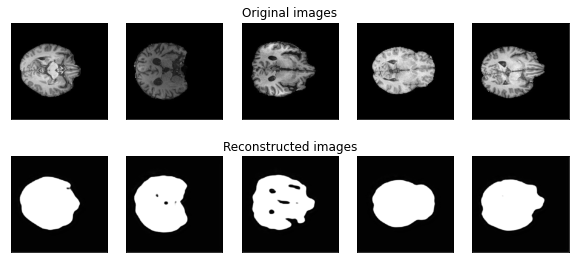


 EPOCH 2/200 	 train loss 0.46968722343444824 	 val loss 0.4643014967441559


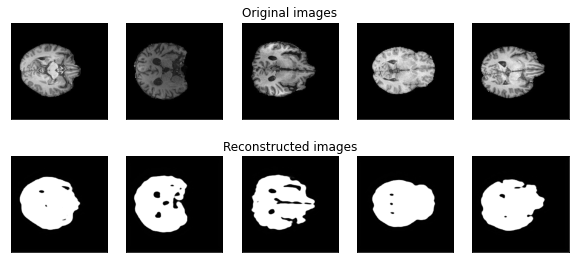


 EPOCH 3/200 	 train loss 0.4630829095840454 	 val loss 0.4606308937072754


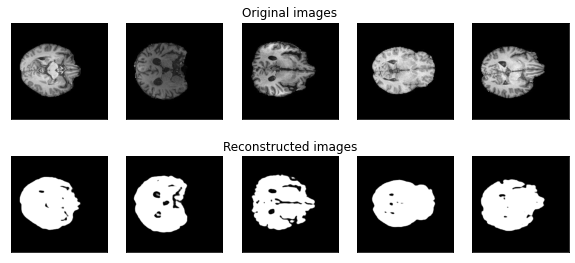


 EPOCH 4/200 	 train loss 0.4601351022720337 	 val loss 0.4583403766155243


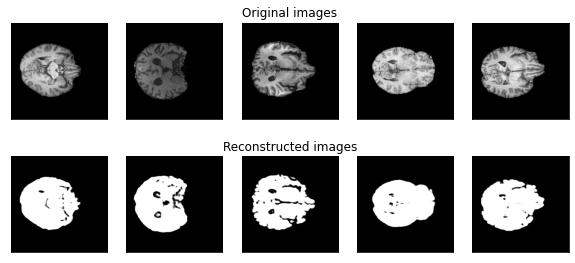


 EPOCH 5/200 	 train loss 0.4584684371948242 	 val loss 0.45740145444869995


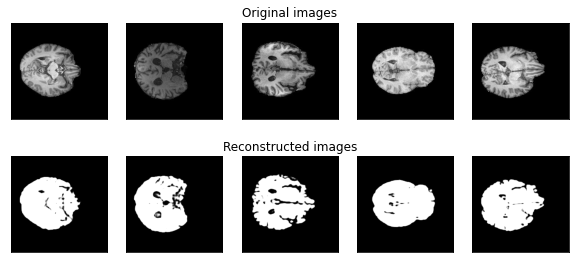


 EPOCH 6/200 	 train loss 0.45930352807044983 	 val loss 0.4589281976222992


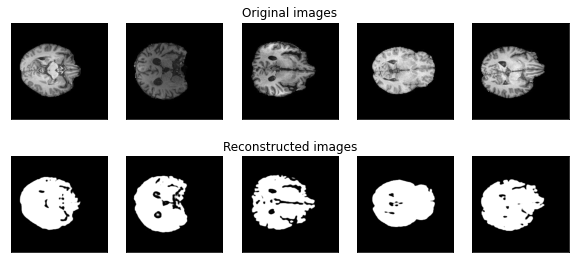


 EPOCH 7/200 	 train loss 0.4584936201572418 	 val loss 0.4565396010875702


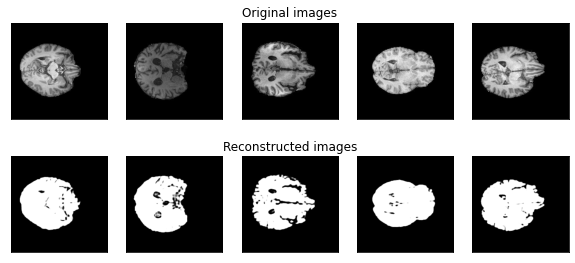


 EPOCH 8/200 	 train loss 0.4570590853691101 	 val loss 0.4557783603668213


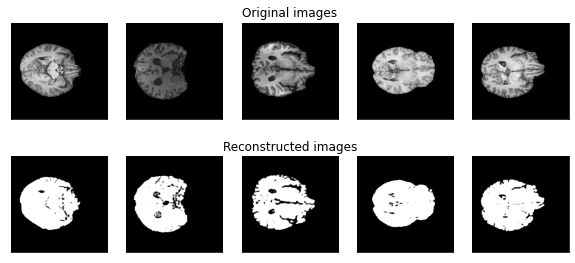


 EPOCH 9/200 	 train loss 0.45638933777809143 	 val loss 0.45531055331230164


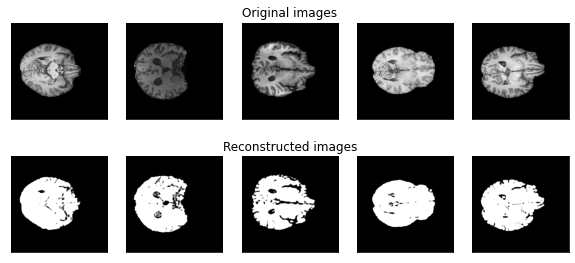


 EPOCH 10/200 	 train loss 0.4559178352355957 	 val loss 0.4550218880176544


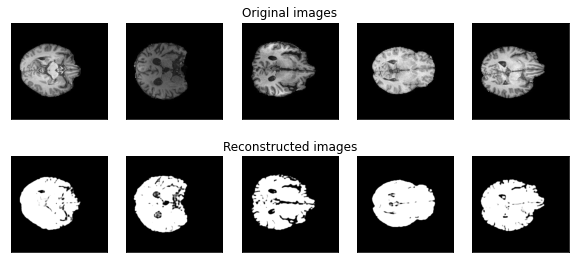


 EPOCH 11/200 	 train loss 0.45547446608543396 	 val loss 0.4549168646335602


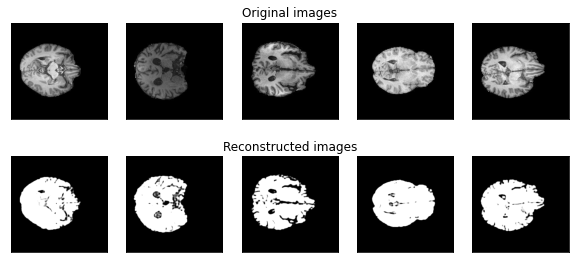


 EPOCH 12/200 	 train loss 0.4550619125366211 	 val loss 0.4542411267757416


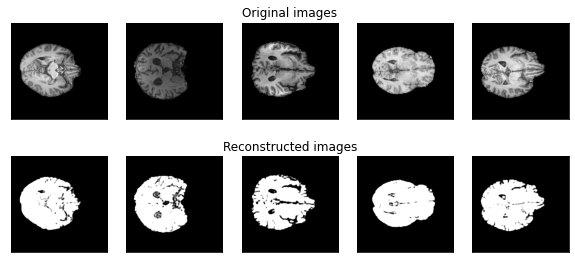


 EPOCH 13/200 	 train loss 0.4547111690044403 	 val loss 0.4540402591228485


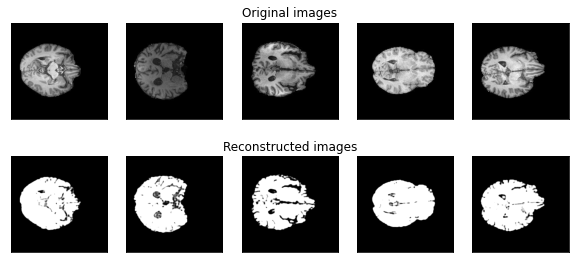


 EPOCH 14/200 	 train loss 0.45442506670951843 	 val loss 0.4537820816040039


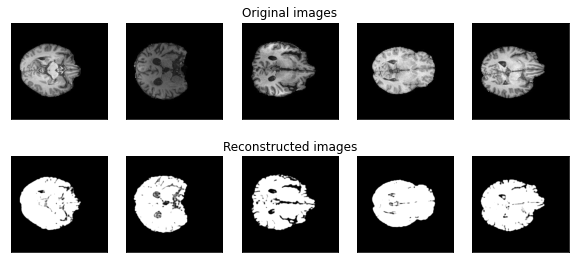


 EPOCH 15/200 	 train loss 0.4541962742805481 	 val loss 0.45358675718307495


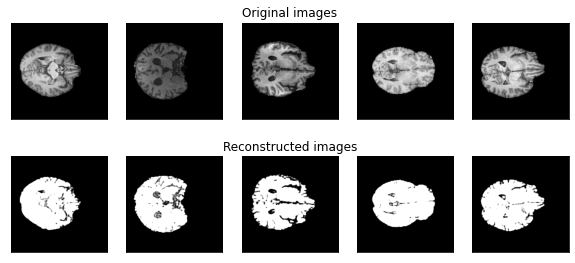


 EPOCH 16/200 	 train loss 0.45393237471580505 	 val loss 0.45348379015922546


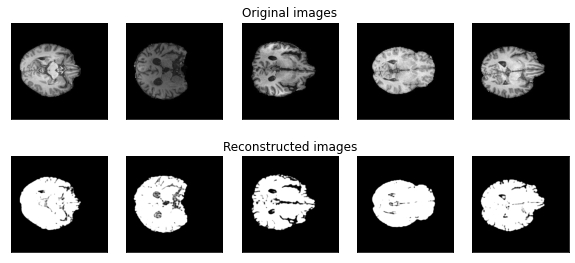


 EPOCH 17/200 	 train loss 0.4537586271762848 	 val loss 0.45323753356933594


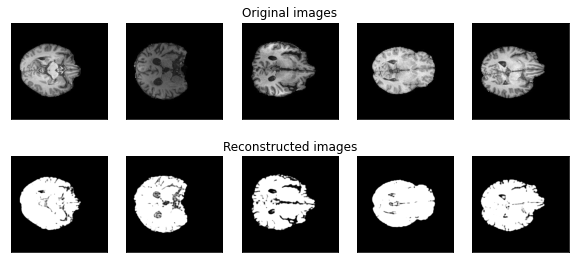


 EPOCH 18/200 	 train loss 0.4535728991031647 	 val loss 0.45305463671684265


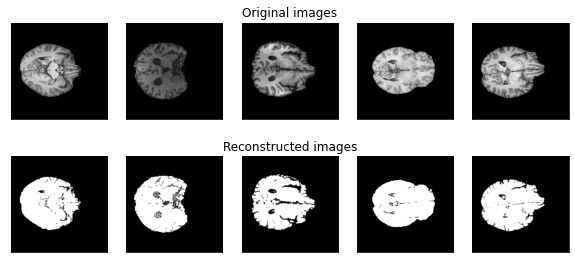


 EPOCH 19/200 	 train loss 0.4533829987049103 	 val loss 0.45296335220336914


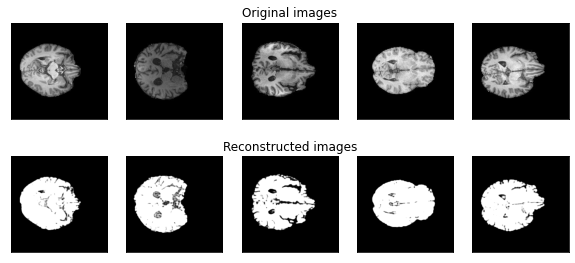


 EPOCH 20/200 	 train loss 0.453254371881485 	 val loss 0.45299240946769714


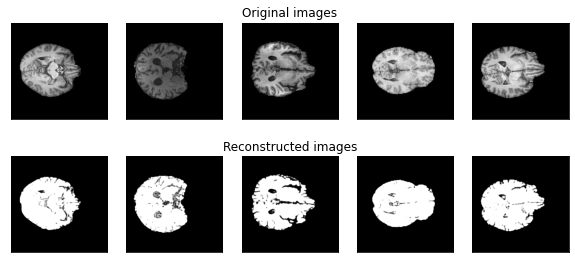


 EPOCH 21/200 	 train loss 0.45334360003471375 	 val loss 0.45291292667388916


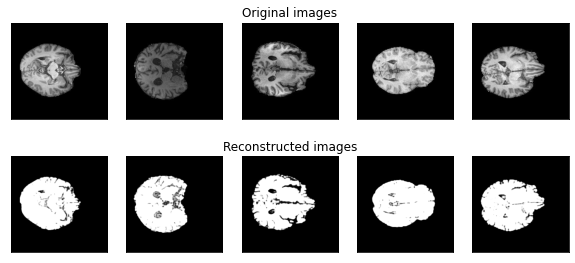


 EPOCH 22/200 	 train loss 0.4530814588069916 	 val loss 0.452615886926651


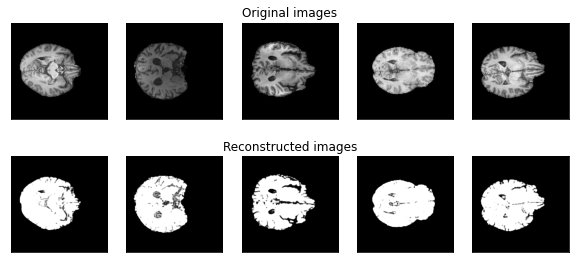


 EPOCH 23/200 	 train loss 0.4529518187046051 	 val loss 0.4525131285190582


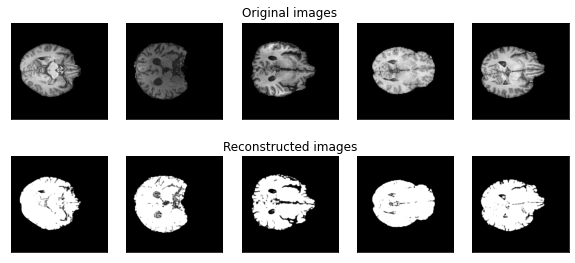


 EPOCH 24/200 	 train loss 0.4528588354587555 	 val loss 0.4524182379245758


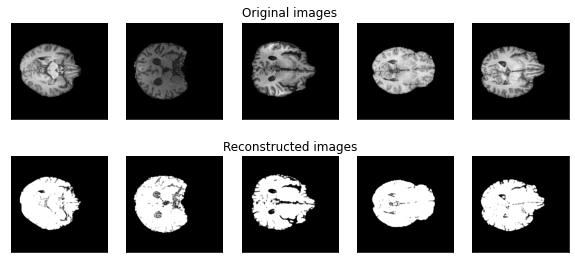


 EPOCH 25/200 	 train loss 0.4527941644191742 	 val loss 0.4523544907569885


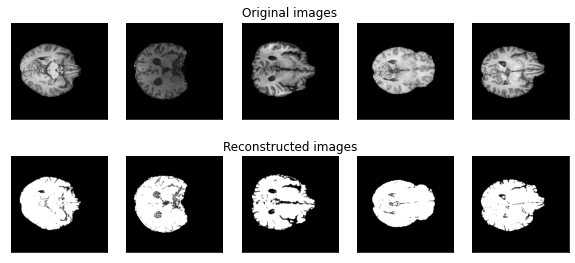


 EPOCH 26/200 	 train loss 0.4527176320552826 	 val loss 0.45228731632232666


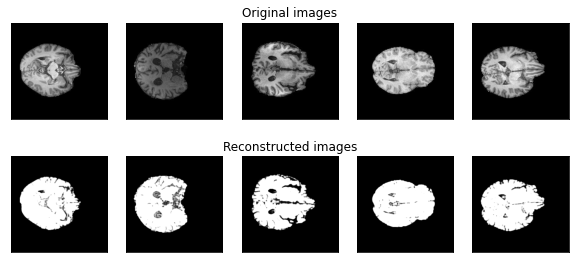


 EPOCH 27/200 	 train loss 0.45264720916748047 	 val loss 0.4522700607776642


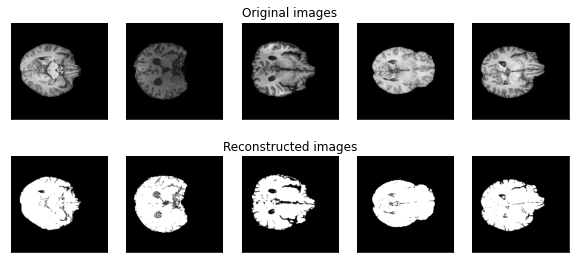


 EPOCH 28/200 	 train loss 0.45259538292884827 	 val loss 0.45220574736595154


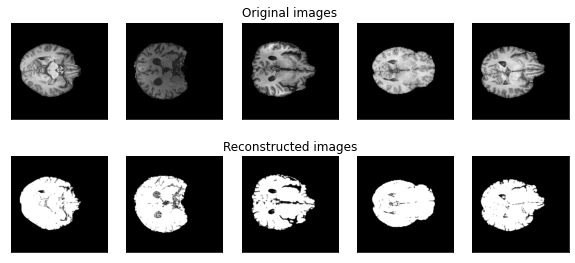


 EPOCH 29/200 	 train loss 0.45266181230545044 	 val loss 0.4540449380874634


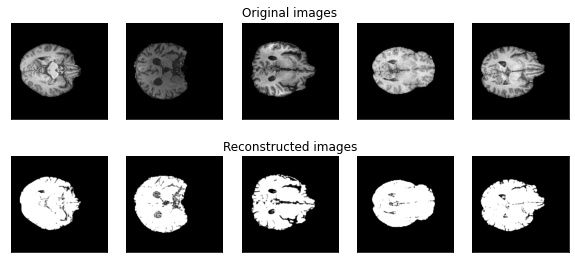


 EPOCH 30/200 	 train loss 0.4555584490299225 	 val loss 0.45378074049949646


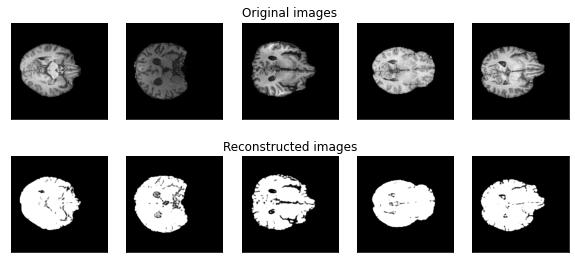


 EPOCH 31/200 	 train loss 0.45358675718307495 	 val loss 0.4530048370361328


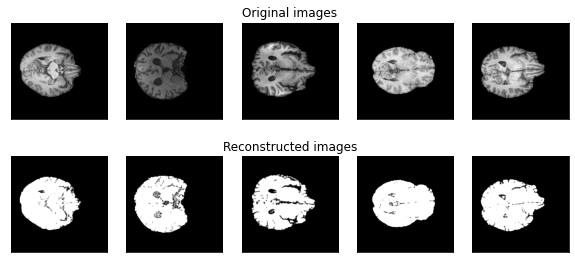


 EPOCH 32/200 	 train loss 0.4530427157878876 	 val loss 0.4525393843650818


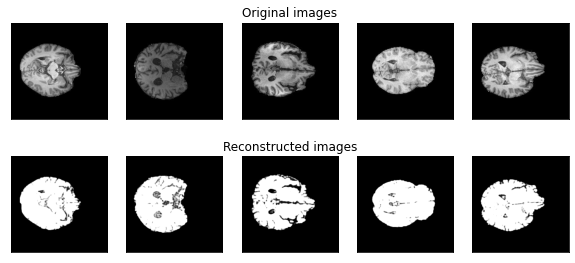


 EPOCH 33/200 	 train loss 0.4528127610683441 	 val loss 0.45249584317207336


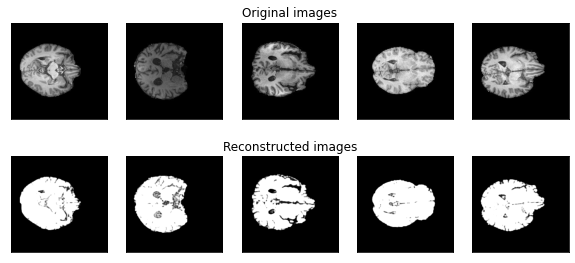


 EPOCH 34/200 	 train loss 0.45264342427253723 	 val loss 0.4523463249206543


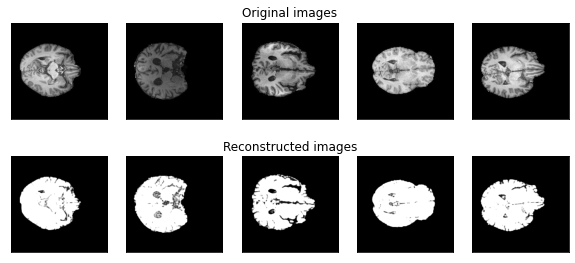


 EPOCH 35/200 	 train loss 0.4525037407875061 	 val loss 0.45219191908836365


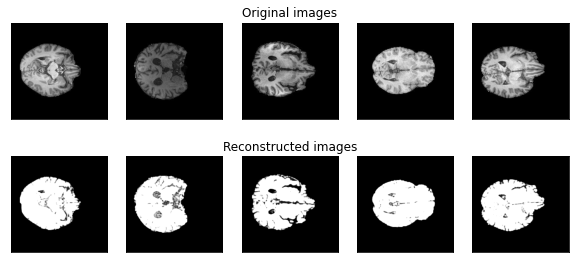


 EPOCH 36/200 	 train loss 0.4524204432964325 	 val loss 0.4520827531814575


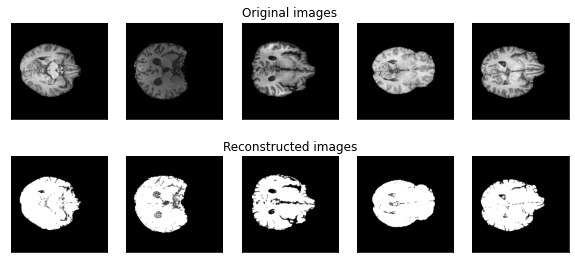


 EPOCH 37/200 	 train loss 0.45232853293418884 	 val loss 0.45198899507522583


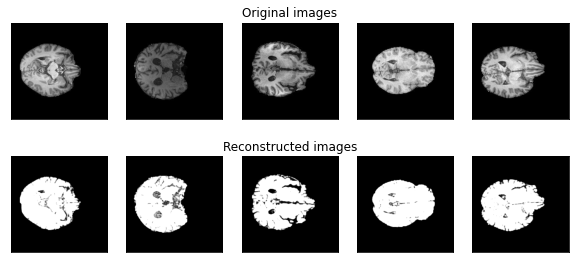


 EPOCH 38/200 	 train loss 0.4522625803947449 	 val loss 0.4519730806350708


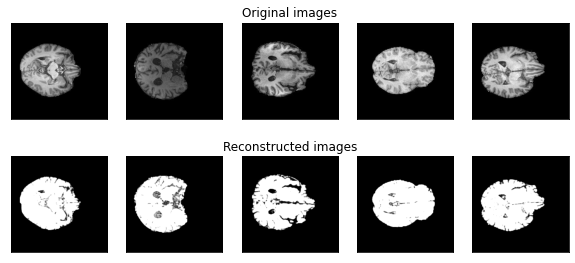


 EPOCH 39/200 	 train loss 0.4522022604942322 	 val loss 0.451896607875824


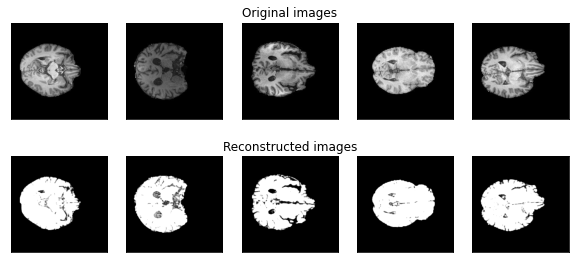


 EPOCH 40/200 	 train loss 0.45212802290916443 	 val loss 0.451795369386673


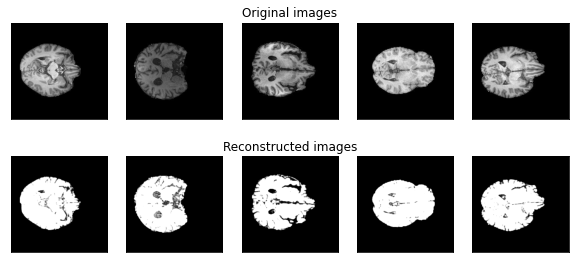


 EPOCH 41/200 	 train loss 0.45209652185440063 	 val loss 0.4518311023712158


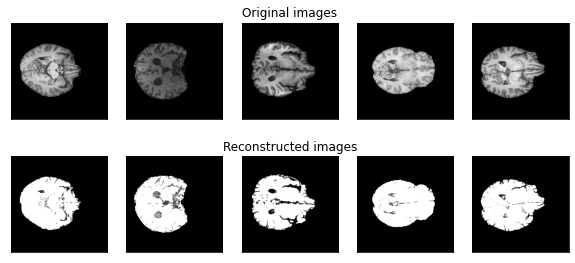


 EPOCH 42/200 	 train loss 0.45208171010017395 	 val loss 0.452281653881073


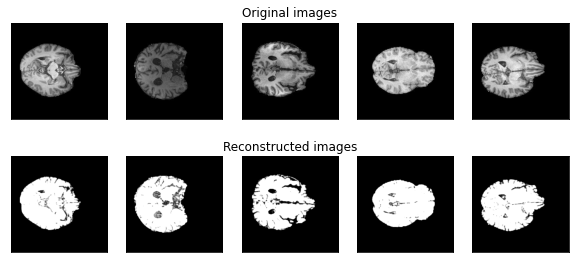


 EPOCH 43/200 	 train loss 0.4519905745983124 	 val loss 0.4545272886753082


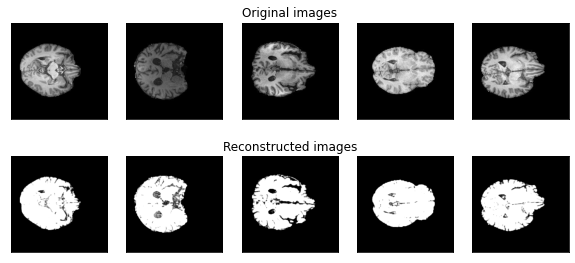


 EPOCH 44/200 	 train loss 0.45649513602256775 	 val loss 0.45712313055992126


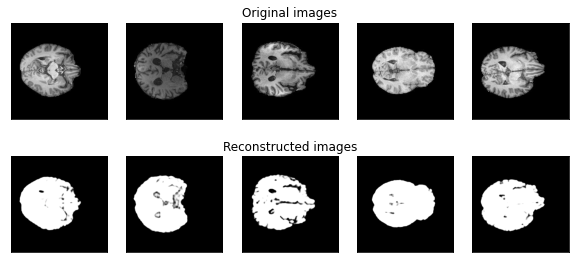


 EPOCH 45/200 	 train loss 0.4550502300262451 	 val loss 0.4540219306945801


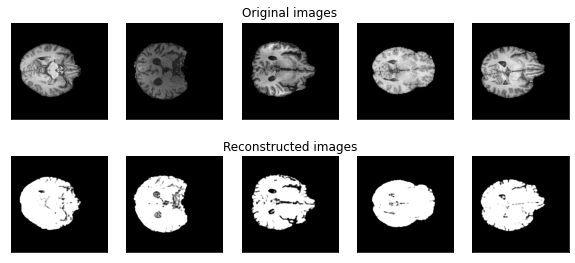


 EPOCH 46/200 	 train loss 0.45382726192474365 	 val loss 0.4533856511116028


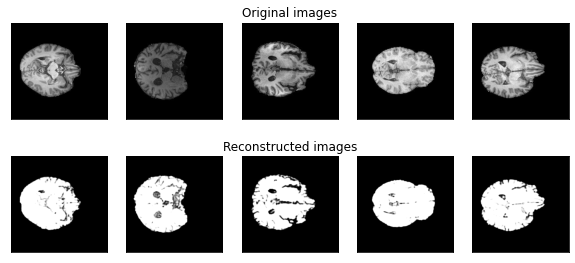


 EPOCH 47/200 	 train loss 0.4533672034740448 	 val loss 0.45296770334243774


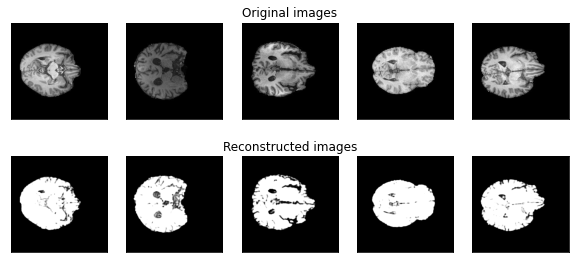


 EPOCH 48/200 	 train loss 0.45310619473457336 	 val loss 0.4527357220649719


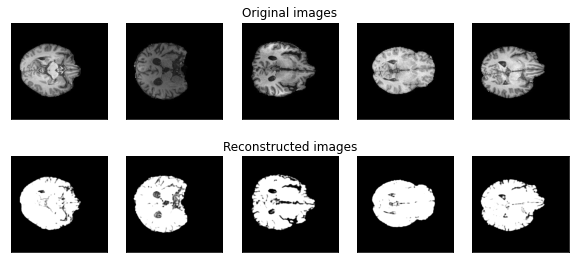


 EPOCH 49/200 	 train loss 0.45292800664901733 	 val loss 0.4525855779647827


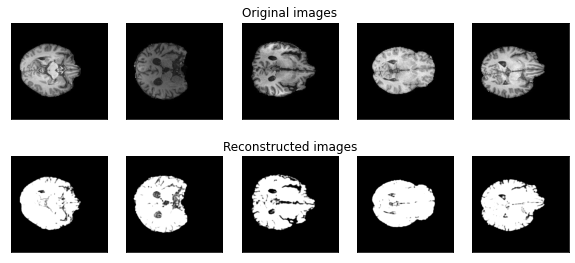


 EPOCH 50/200 	 train loss 0.45279955863952637 	 val loss 0.45247870683670044


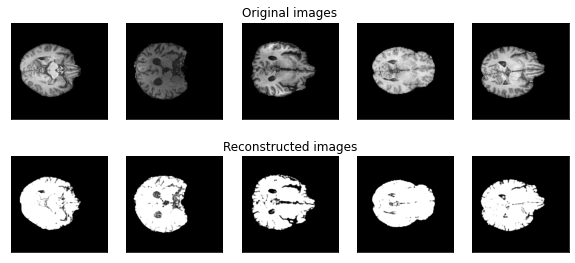


 EPOCH 51/200 	 train loss 0.4526827931404114 	 val loss 0.45238184928894043


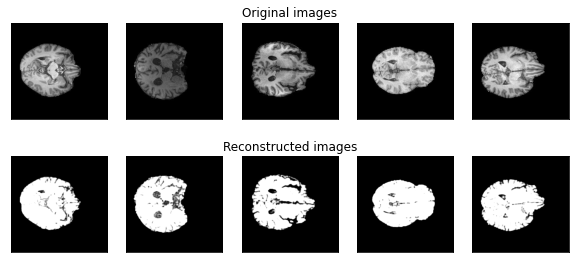


 EPOCH 52/200 	 train loss 0.45258286595344543 	 val loss 0.45227187871932983


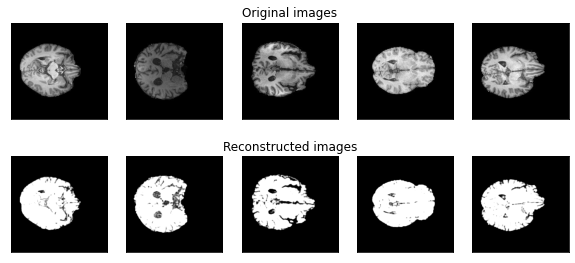


 EPOCH 53/200 	 train loss 0.4524998366832733 	 val loss 0.45220085978507996


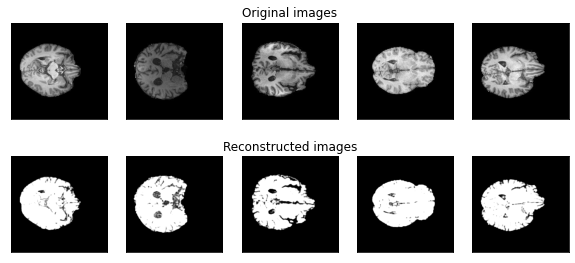


 EPOCH 54/200 	 train loss 0.4524298310279846 	 val loss 0.4521472752094269


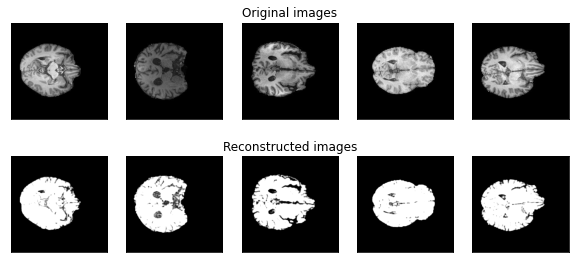


 EPOCH 55/200 	 train loss 0.4523751735687256 	 val loss 0.4535905122756958


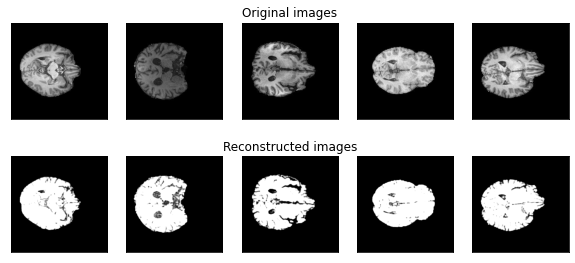


 EPOCH 56/200 	 train loss 0.45232102274894714 	 val loss 0.45200955867767334


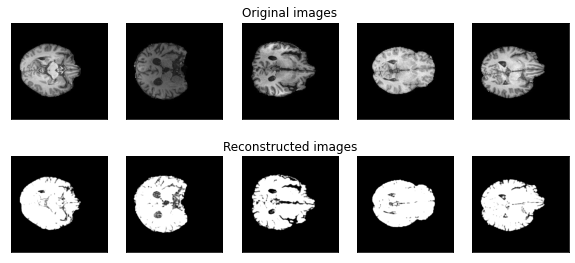


 EPOCH 57/200 	 train loss 0.4522456228733063 	 val loss 0.4522382915019989


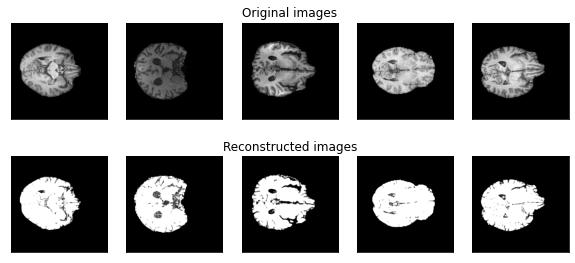


 EPOCH 58/200 	 train loss 0.45221057534217834 	 val loss 0.45214366912841797


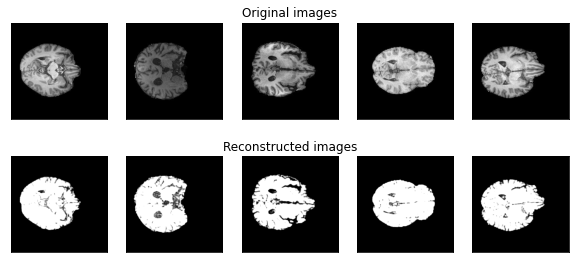


 EPOCH 59/200 	 train loss 0.45216625928878784 	 val loss 0.45189064741134644


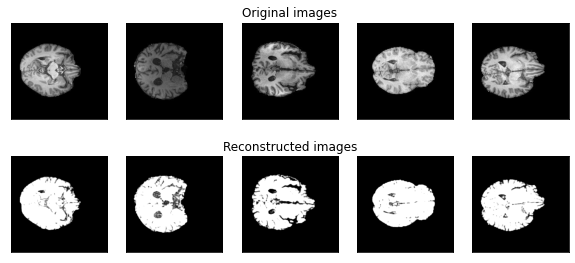


 EPOCH 60/200 	 train loss 0.452128529548645 	 val loss 0.4533945918083191


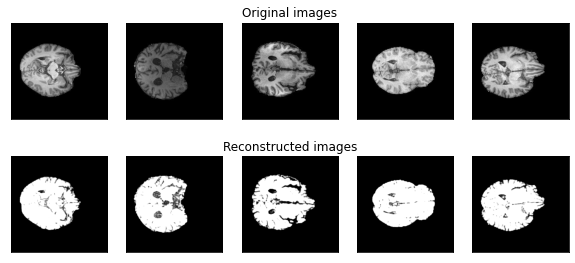


 EPOCH 61/200 	 train loss 0.45210281014442444 	 val loss 0.4518398642539978


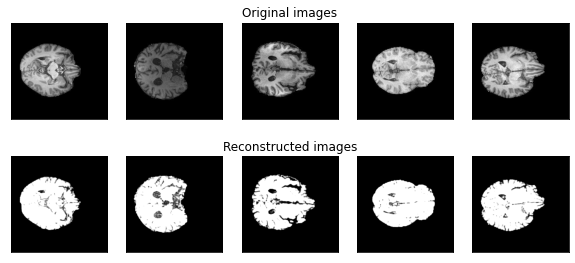


 EPOCH 62/200 	 train loss 0.45203790068626404 	 val loss 0.4517797529697418


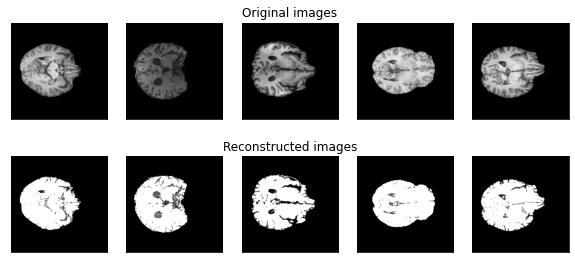


 EPOCH 63/200 	 train loss 0.4520137906074524 	 val loss 0.45174136757850647


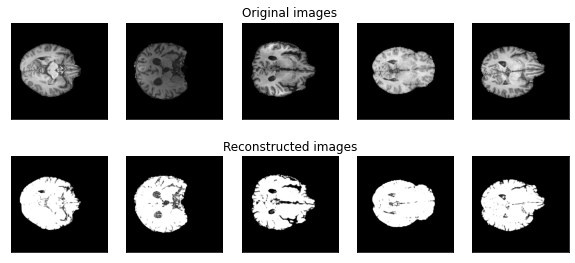


 EPOCH 64/200 	 train loss 0.45199403166770935 	 val loss 0.45173847675323486


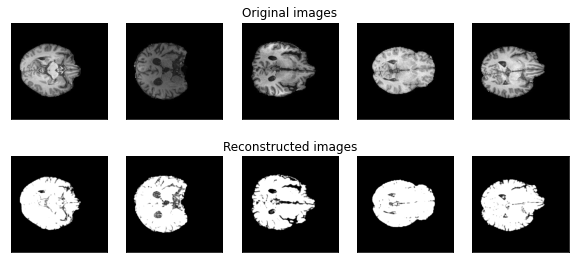


 EPOCH 65/200 	 train loss 0.45197200775146484 	 val loss 0.45176050066947937


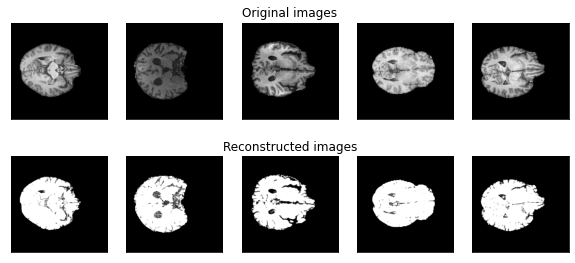


 EPOCH 66/200 	 train loss 0.4519439935684204 	 val loss 0.4516487419605255


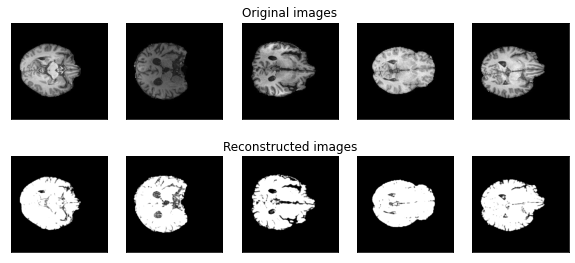


 EPOCH 67/200 	 train loss 0.45191240310668945 	 val loss 0.45164933800697327


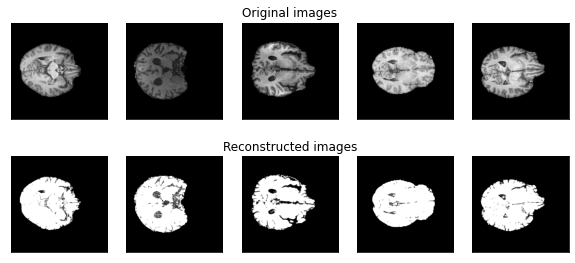


 EPOCH 68/200 	 train loss 0.4518849849700928 	 val loss 0.45163294672966003


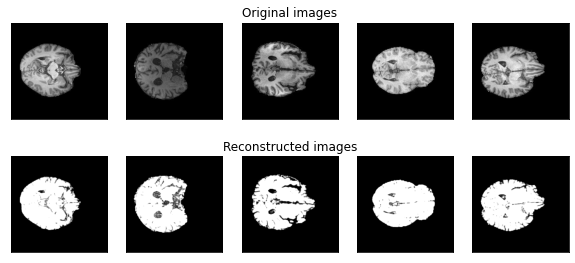


 EPOCH 69/200 	 train loss 0.4518560469150543 	 val loss 0.45157912373542786


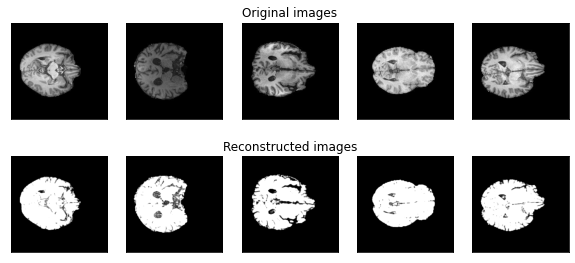


 EPOCH 70/200 	 train loss 0.4518192410469055 	 val loss 0.45155972242355347


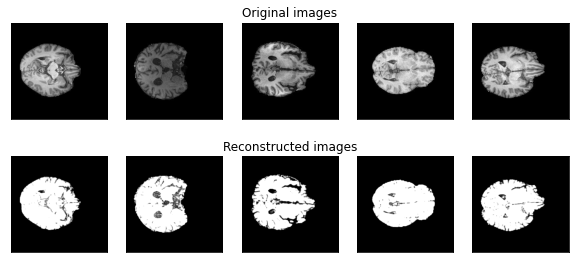


 EPOCH 71/200 	 train loss 0.45179376006126404 	 val loss 0.45151206851005554


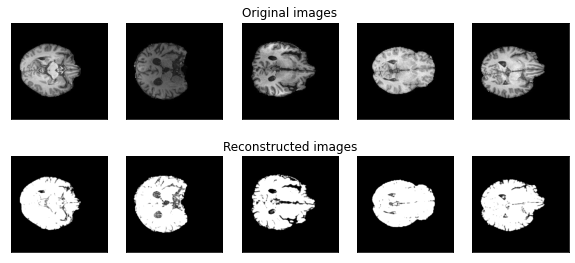


 EPOCH 72/200 	 train loss 0.4517507255077362 	 val loss 0.45148348808288574


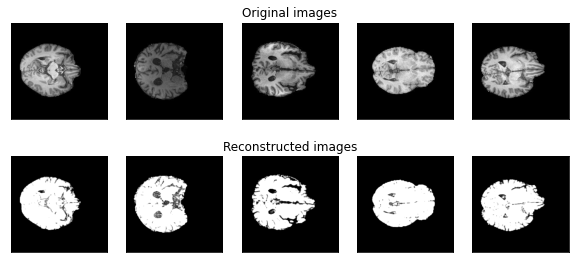


 EPOCH 73/200 	 train loss 0.45172274112701416 	 val loss 0.45146360993385315


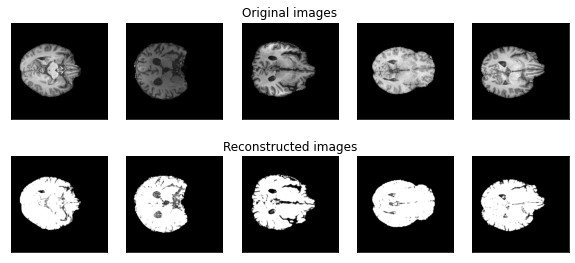


 EPOCH 74/200 	 train loss 0.451698899269104 	 val loss 0.45145800709724426


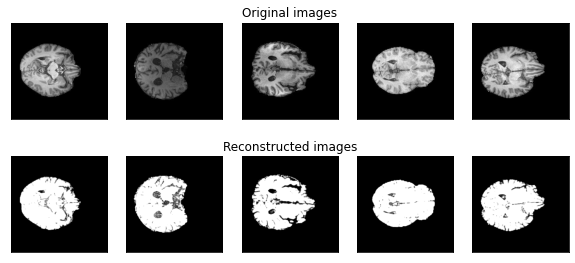


 EPOCH 75/200 	 train loss 0.45166581869125366 	 val loss 0.45141109824180603


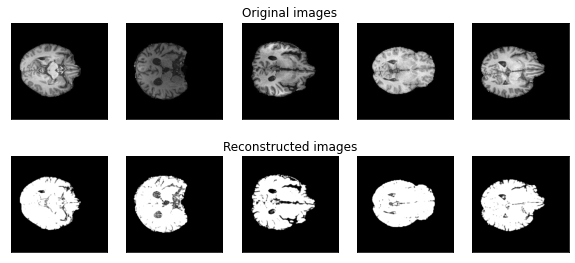


 EPOCH 76/200 	 train loss 0.45163246989250183 	 val loss 0.45139434933662415


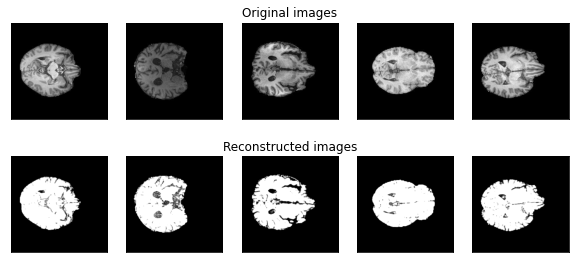


 EPOCH 77/200 	 train loss 0.4518430531024933 	 val loss 0.4515717625617981


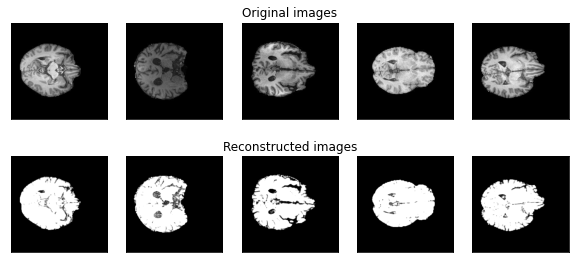


 EPOCH 78/200 	 train loss 0.45189517736434937 	 val loss 0.4514423906803131


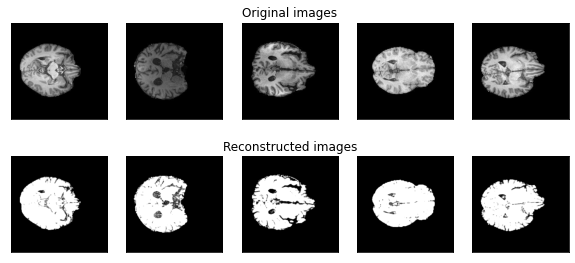


 EPOCH 79/200 	 train loss 0.4516447186470032 	 val loss 0.45140504837036133


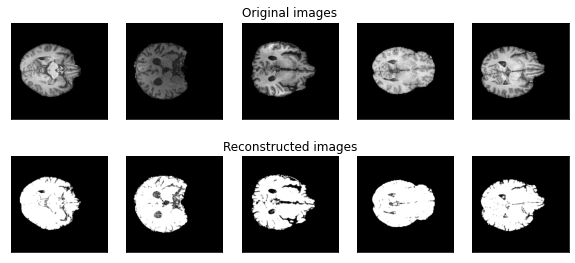


 EPOCH 80/200 	 train loss 0.45160776376724243 	 val loss 0.45133355259895325


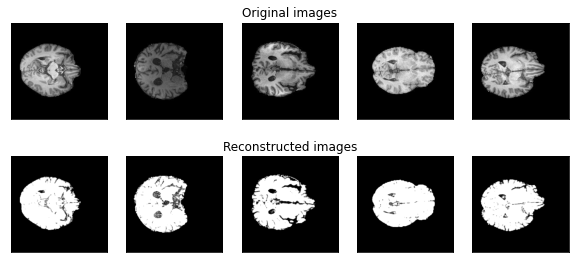


 EPOCH 81/200 	 train loss 0.45153841376304626 	 val loss 0.45132845640182495


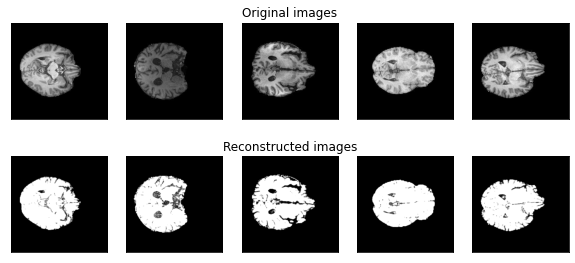


 EPOCH 82/200 	 train loss 0.4514966309070587 	 val loss 0.45132017135620117


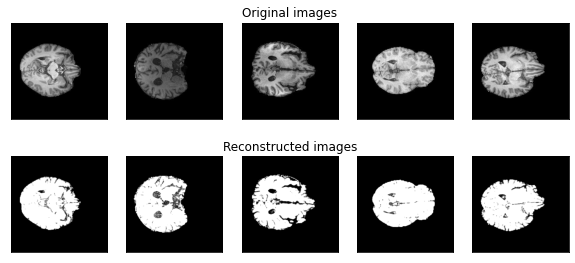


 EPOCH 83/200 	 train loss 0.45146629214286804 	 val loss 0.45128604769706726


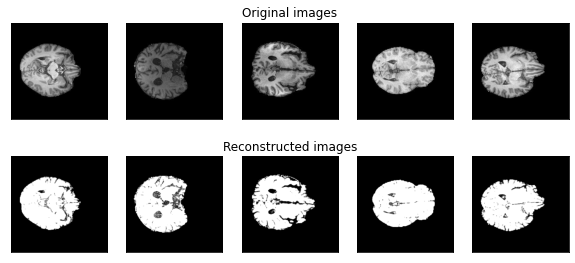


 EPOCH 84/200 	 train loss 0.4514315128326416 	 val loss 0.451231986284256


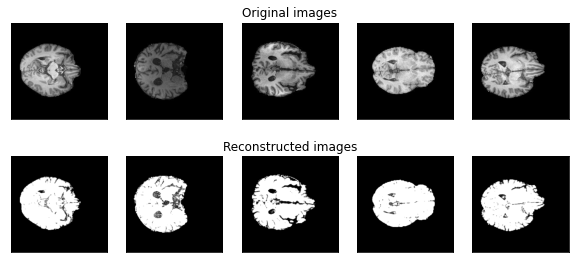


 EPOCH 85/200 	 train loss 0.4513913691043854 	 val loss 0.45119911432266235


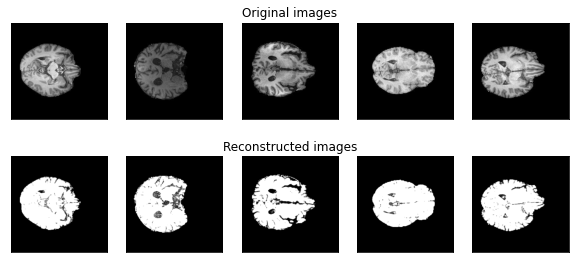


 EPOCH 86/200 	 train loss 0.4513559639453888 	 val loss 0.45120084285736084


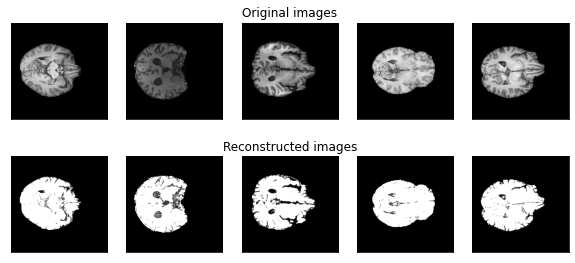


 EPOCH 87/200 	 train loss 0.4513309597969055 	 val loss 0.45120474696159363


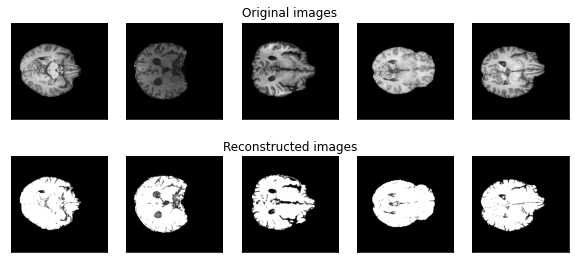


 EPOCH 88/200 	 train loss 0.45131126046180725 	 val loss 0.45123034715652466


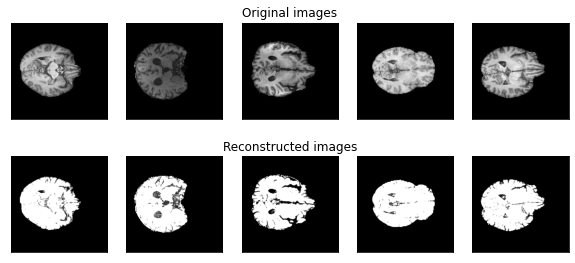


 EPOCH 89/200 	 train loss 0.4513009786605835 	 val loss 0.45122265815734863


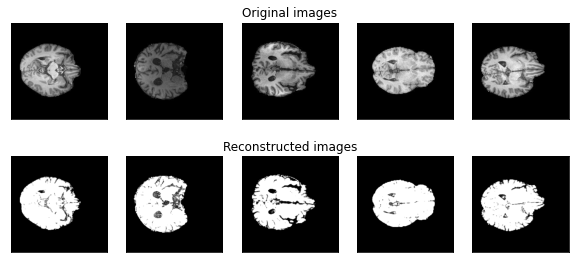


 EPOCH 90/200 	 train loss 0.4512837529182434 	 val loss 0.4512706398963928


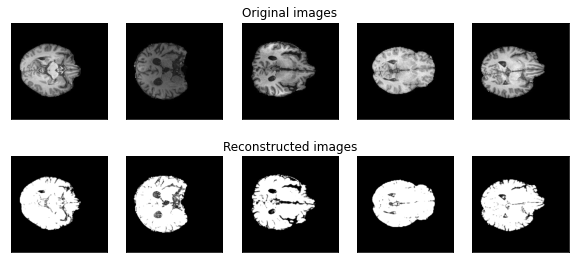


 EPOCH 91/200 	 train loss 0.4512876570224762 	 val loss 0.4512867331504822


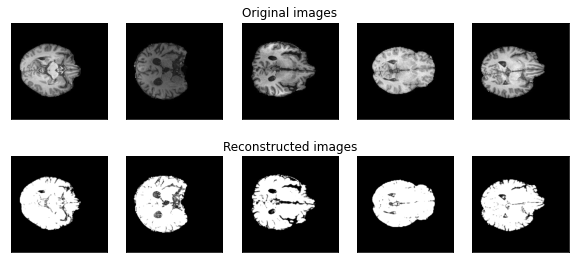


 EPOCH 92/200 	 train loss 0.45130470395088196 	 val loss 0.45115625858306885


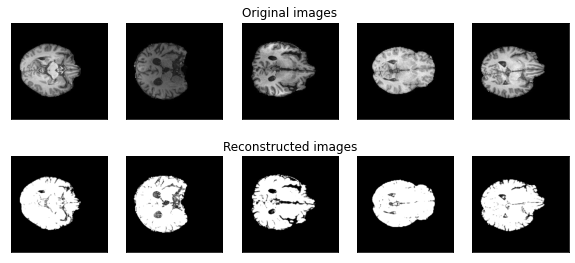


 EPOCH 93/200 	 train loss 0.45126956701278687 	 val loss 0.4513098895549774


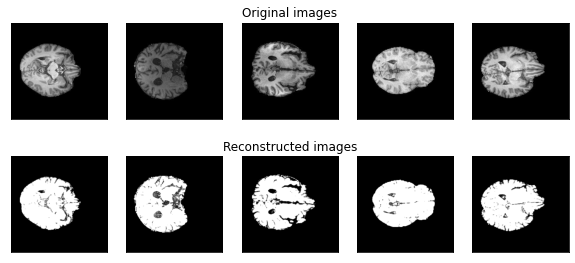


 EPOCH 94/200 	 train loss 0.4512413442134857 	 val loss 0.4513264298439026


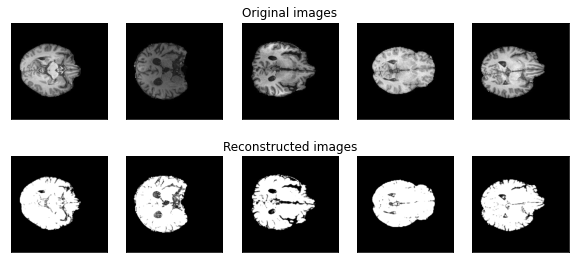


 EPOCH 95/200 	 train loss 0.4512224793434143 	 val loss 0.45119112730026245


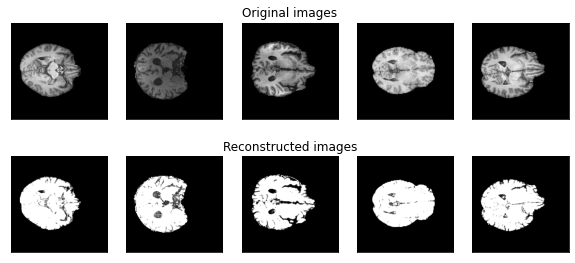


 EPOCH 96/200 	 train loss 0.4512006342411041 	 val loss 0.45119863748550415


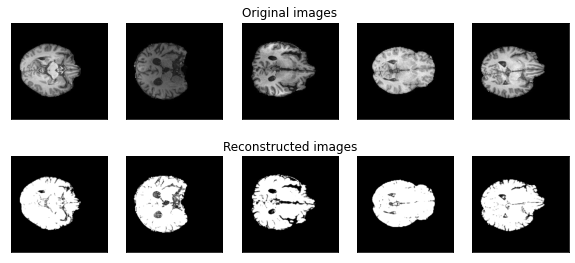


 EPOCH 97/200 	 train loss 0.4512541890144348 	 val loss 0.4510509967803955


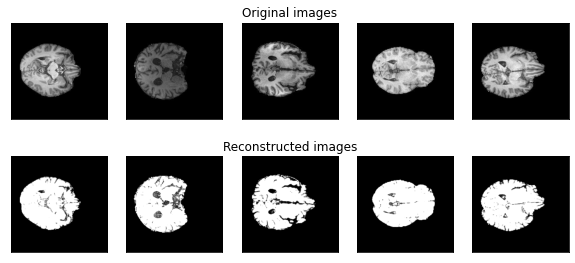


 EPOCH 98/200 	 train loss 0.45117563009262085 	 val loss 0.45123130083084106


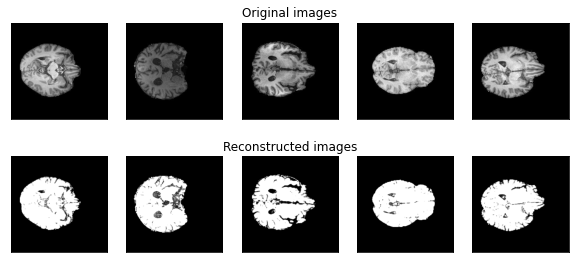


 EPOCH 99/200 	 train loss 0.4511517286300659 	 val loss 0.4512041509151459


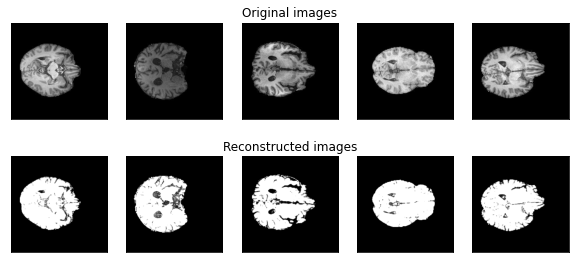


 EPOCH 100/200 	 train loss 0.45112642645835876 	 val loss 0.45112261176109314


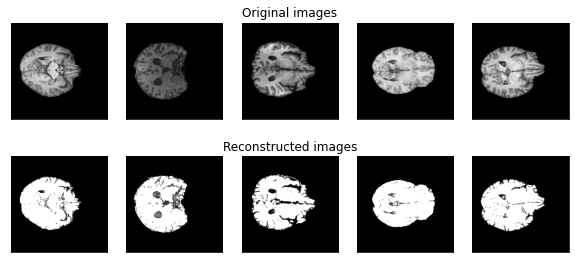


 EPOCH 101/200 	 train loss 0.45109638571739197 	 val loss 0.45114219188690186


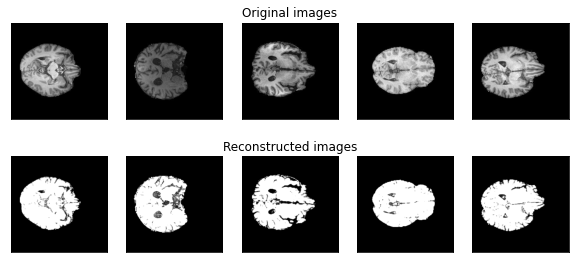


 EPOCH 102/200 	 train loss 0.4510941803455353 	 val loss 0.45107319951057434


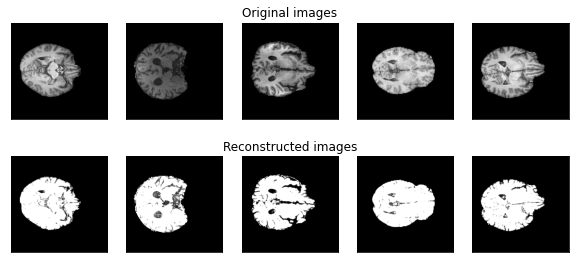


 EPOCH 103/200 	 train loss 0.451070100069046 	 val loss 0.45106184482574463


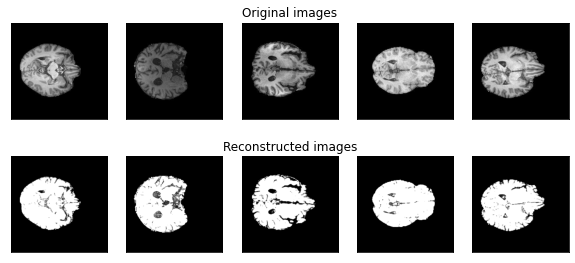


 EPOCH 104/200 	 train loss 0.45104581117630005 	 val loss 0.45106497406959534


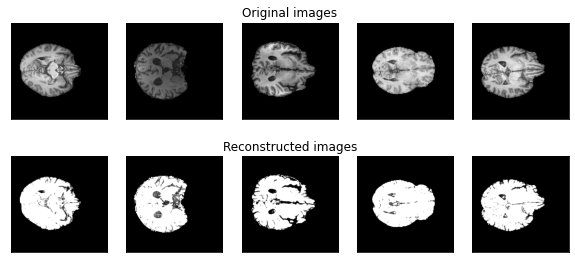


 EPOCH 105/200 	 train loss 0.45104411244392395 	 val loss 0.4510315954685211


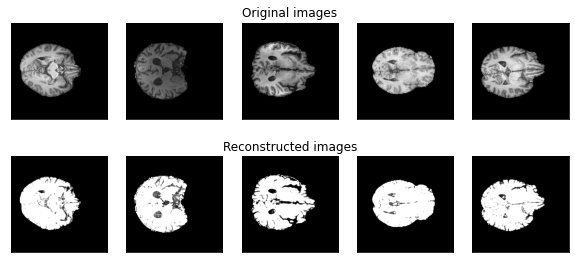


 EPOCH 106/200 	 train loss 0.4510153532028198 	 val loss 0.4510408341884613


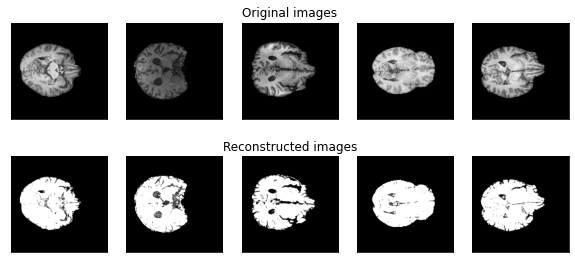


 EPOCH 107/200 	 train loss 0.4510653018951416 	 val loss 0.45117712020874023


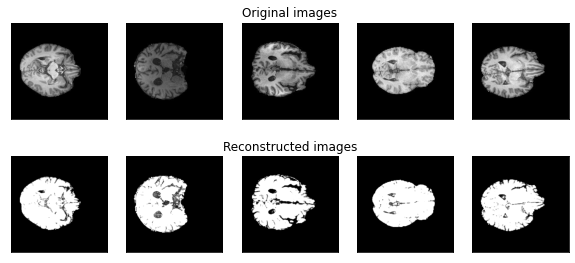


 EPOCH 108/200 	 train loss 0.451031357049942 	 val loss 0.450984925031662


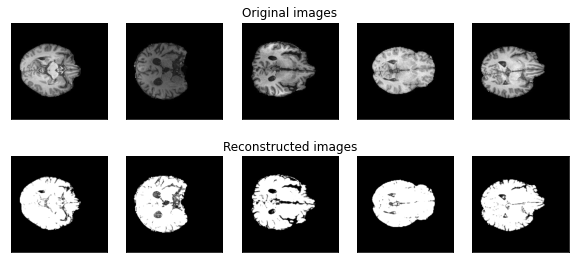


 EPOCH 109/200 	 train loss 0.4509703516960144 	 val loss 0.4509900212287903


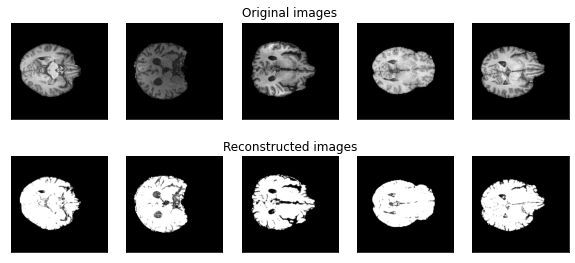


 EPOCH 110/200 	 train loss 0.4509434401988983 	 val loss 0.4509689211845398


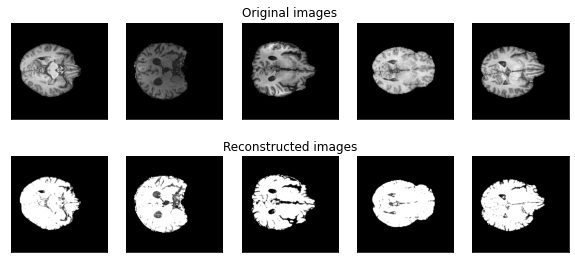


 EPOCH 111/200 	 train loss 0.45136505365371704 	 val loss 0.45116207003593445


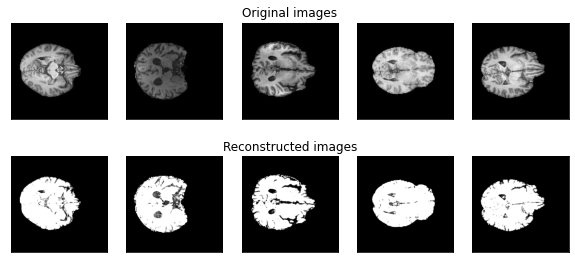


 EPOCH 112/200 	 train loss 0.45116329193115234 	 val loss 0.45088621973991394


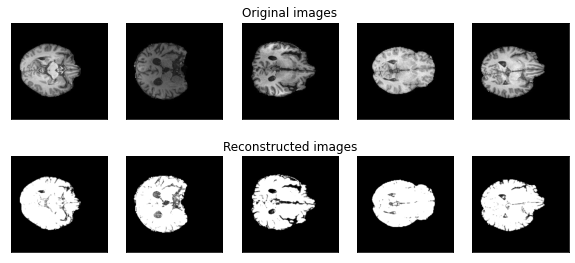


 EPOCH 113/200 	 train loss 0.450996071100235 	 val loss 0.45096784830093384


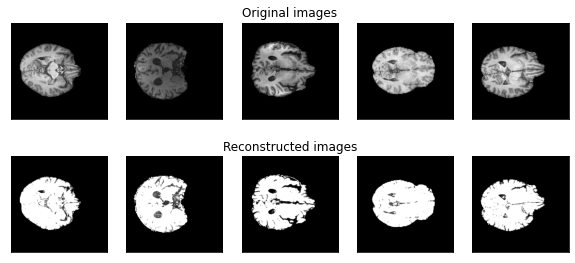


 EPOCH 114/200 	 train loss 0.45094504952430725 	 val loss 0.4509584903717041


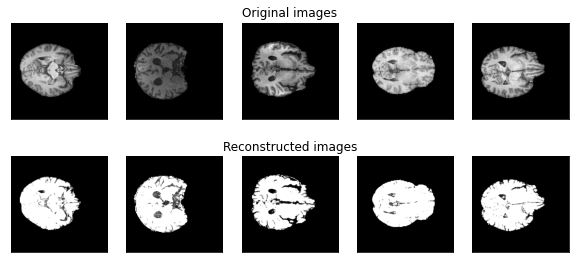


 EPOCH 115/200 	 train loss 0.4509056508541107 	 val loss 0.4507196843624115


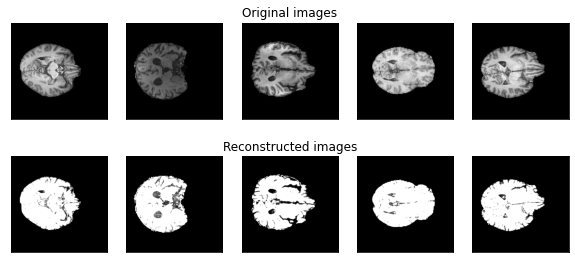


 EPOCH 116/200 	 train loss 0.4508785307407379 	 val loss 0.45068928599357605


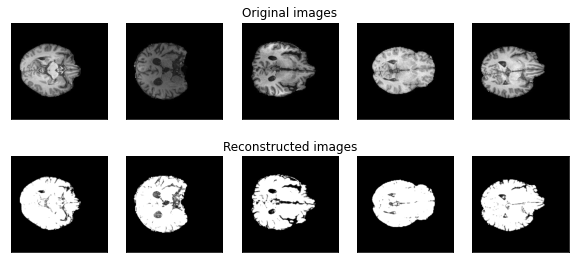


 EPOCH 117/200 	 train loss 0.4508497416973114 	 val loss 0.45069748163223267


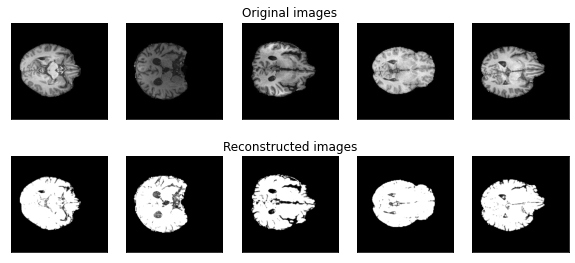


 EPOCH 118/200 	 train loss 0.4508384168148041 	 val loss 0.4506697356700897


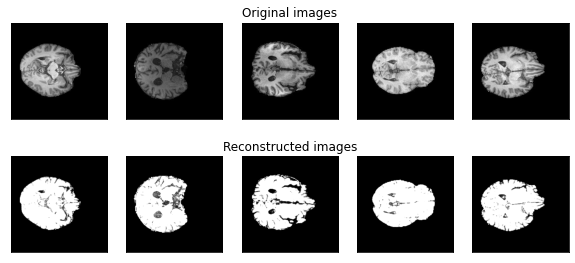


 EPOCH 119/200 	 train loss 0.45081835985183716 	 val loss 0.45069068670272827


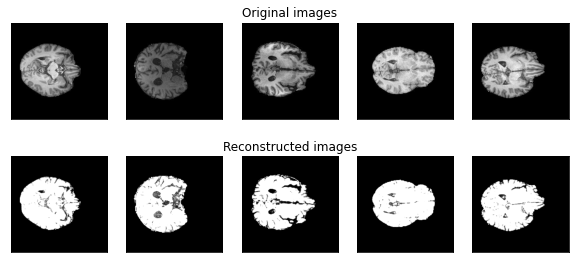


 EPOCH 120/200 	 train loss 0.4508018493652344 	 val loss 0.450669527053833


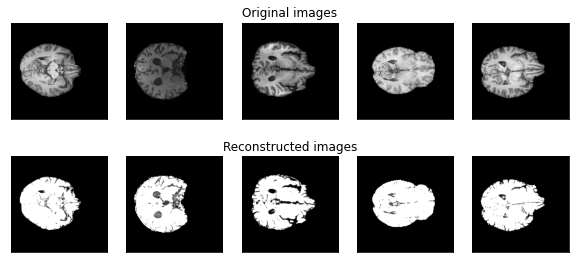


 EPOCH 121/200 	 train loss 0.4507930278778076 	 val loss 0.4506514370441437


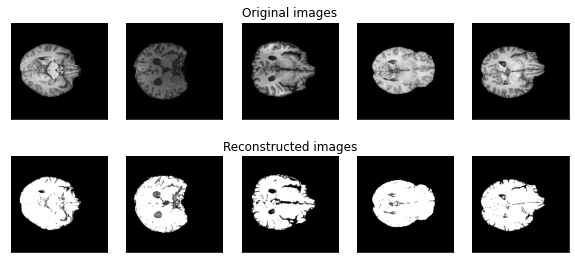


 EPOCH 122/200 	 train loss 0.45080435276031494 	 val loss 0.4507809579372406


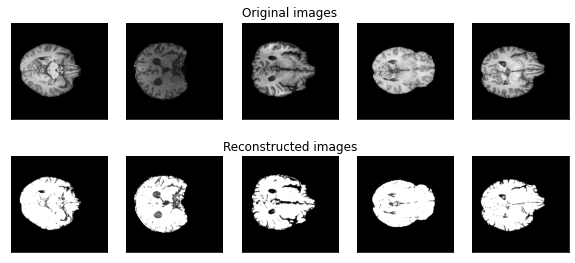


 EPOCH 123/200 	 train loss 0.45079001784324646 	 val loss 0.450667142868042


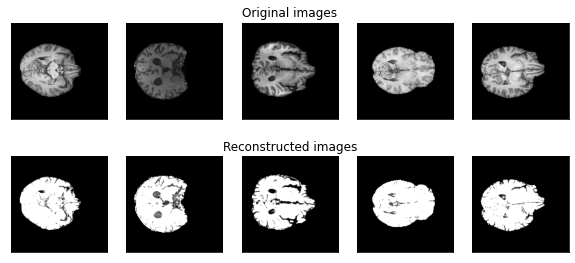


 EPOCH 124/200 	 train loss 0.45079371333122253 	 val loss 0.45070797204971313


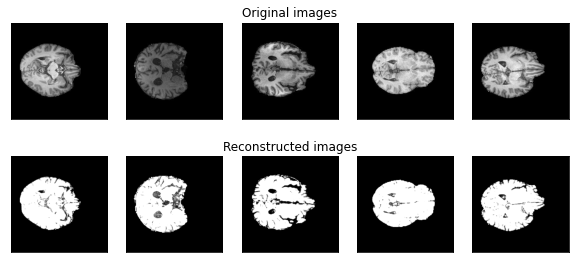


 EPOCH 125/200 	 train loss 0.4507664442062378 	 val loss 0.4505784809589386


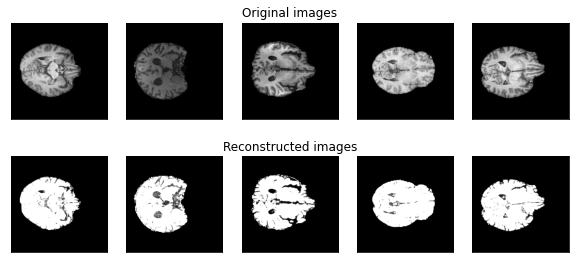


 EPOCH 126/200 	 train loss 0.4507412612438202 	 val loss 0.45063453912734985


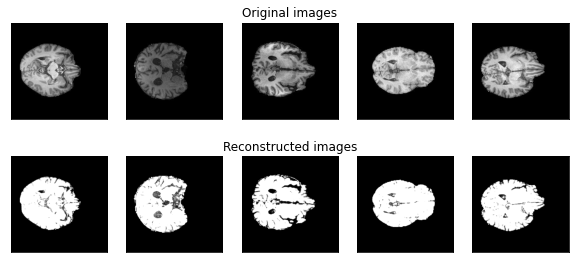


 EPOCH 127/200 	 train loss 0.45072847604751587 	 val loss 0.4505979120731354


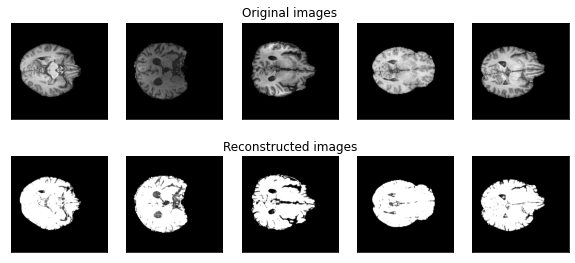


 EPOCH 128/200 	 train loss 0.4507963955402374 	 val loss 0.4513038992881775


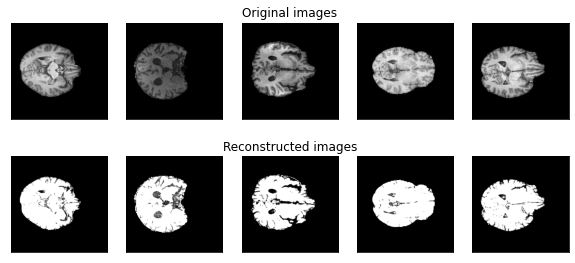


 EPOCH 129/200 	 train loss 0.45081156492233276 	 val loss 0.4505753815174103


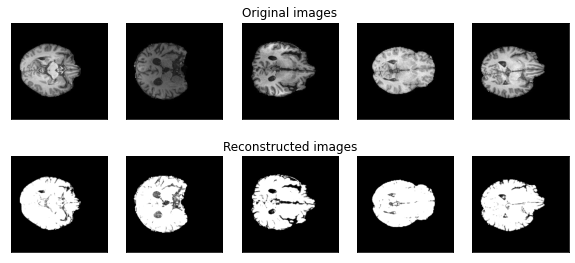


 EPOCH 130/200 	 train loss 0.4507114887237549 	 val loss 0.4505440890789032


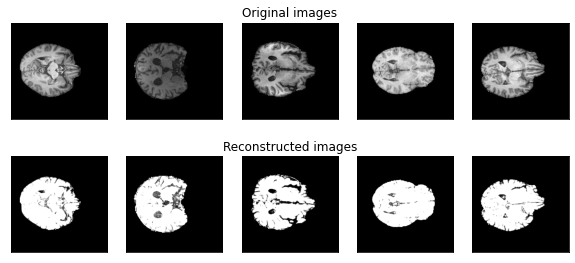


 EPOCH 131/200 	 train loss 0.4506869912147522 	 val loss 0.45052337646484375


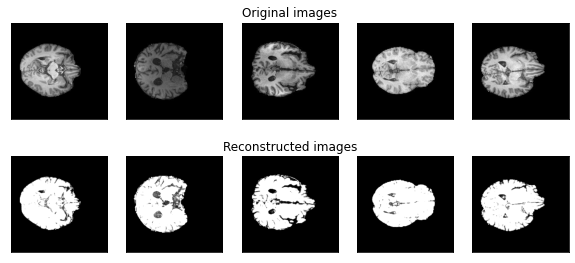


 EPOCH 132/200 	 train loss 0.4506794810295105 	 val loss 0.45052585005760193


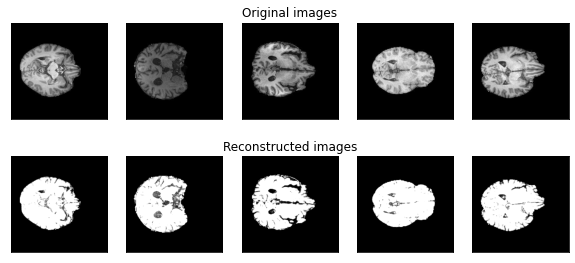


 EPOCH 133/200 	 train loss 0.45068398118019104 	 val loss 0.45052120089530945


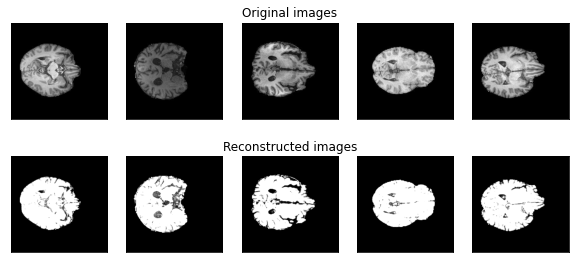


 EPOCH 134/200 	 train loss 0.45065420866012573 	 val loss 0.4504983425140381


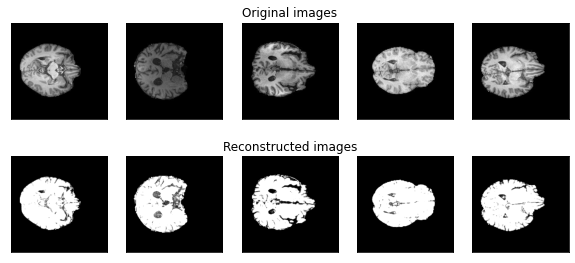


 EPOCH 135/200 	 train loss 0.4506246745586395 	 val loss 0.45049867033958435


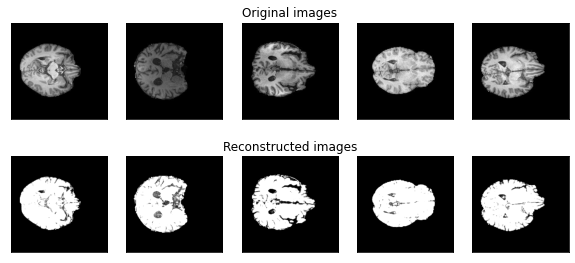


 EPOCH 136/200 	 train loss 0.4506123661994934 	 val loss 0.4504680335521698


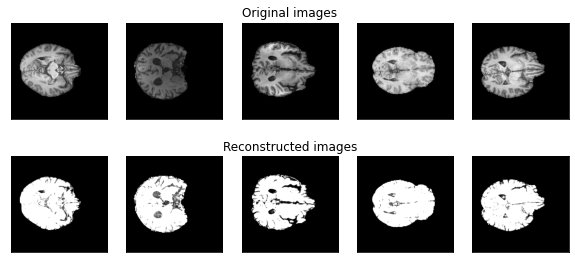


 EPOCH 137/200 	 train loss 0.4506070017814636 	 val loss 0.4504721462726593


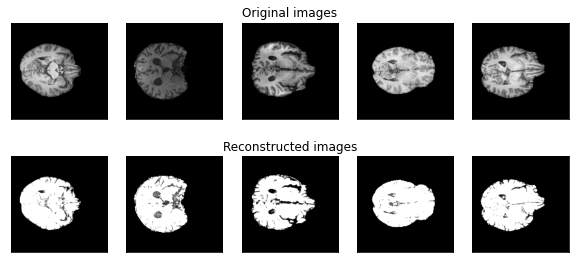


 EPOCH 138/200 	 train loss 0.450601726770401 	 val loss 0.4504677951335907


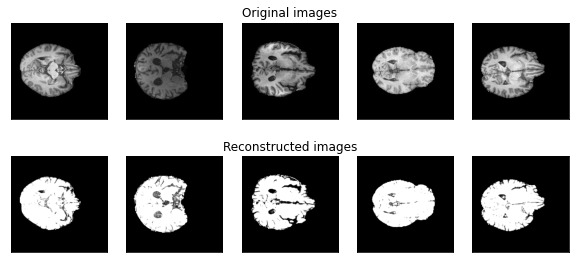


 EPOCH 139/200 	 train loss 0.4505971074104309 	 val loss 0.45045170187950134


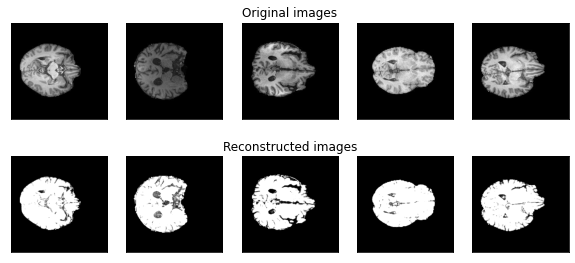


 EPOCH 140/200 	 train loss 0.4505840241909027 	 val loss 0.450454980134964


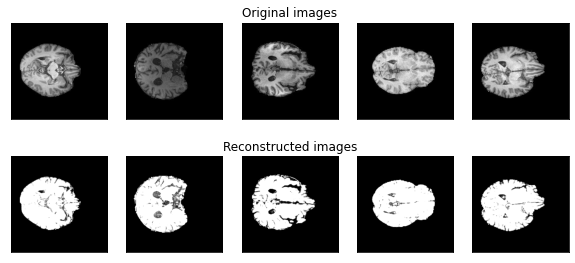


 EPOCH 141/200 	 train loss 0.4505719244480133 	 val loss 0.4504519999027252


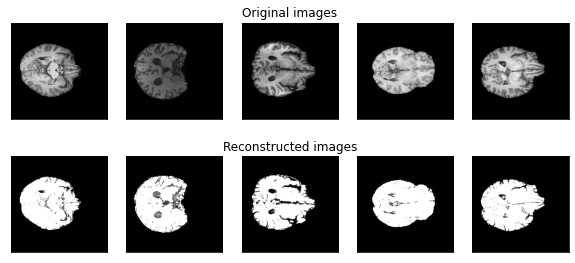


 EPOCH 142/200 	 train loss 0.4505636990070343 	 val loss 0.4504311978816986


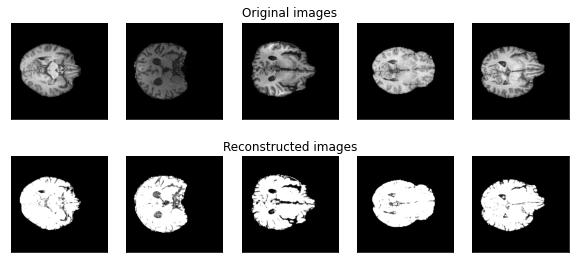


 EPOCH 143/200 	 train loss 0.4505555331707001 	 val loss 0.4504319727420807


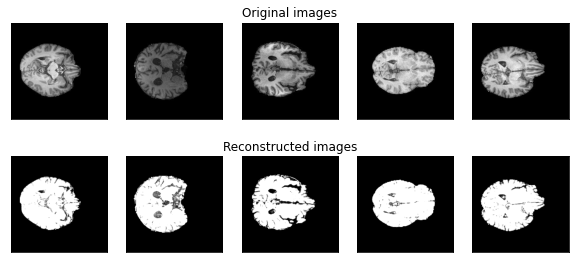


 EPOCH 144/200 	 train loss 0.4505455791950226 	 val loss 0.45042532682418823


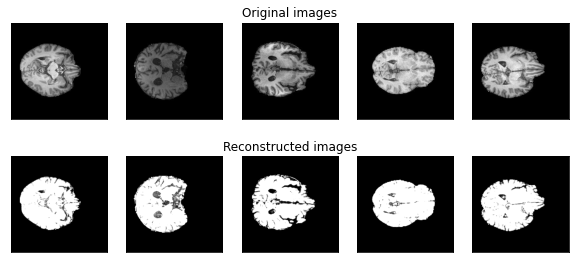


 EPOCH 145/200 	 train loss 0.45054271817207336 	 val loss 0.450392484664917


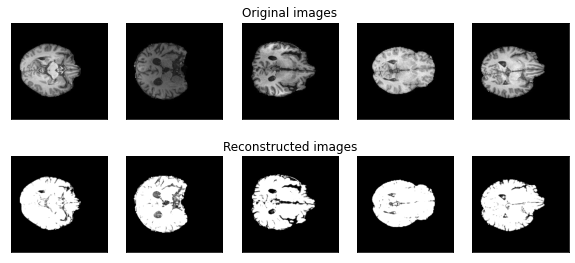


 EPOCH 146/200 	 train loss 0.45052388310432434 	 val loss 0.45038652420043945


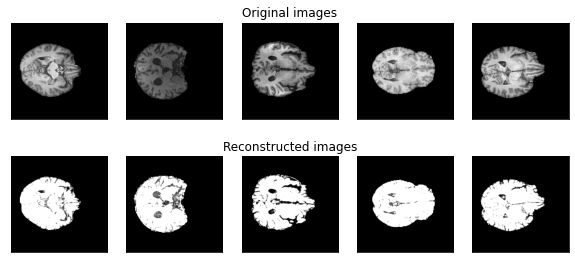


 EPOCH 147/200 	 train loss 0.4505281448364258 	 val loss 0.45039042830467224


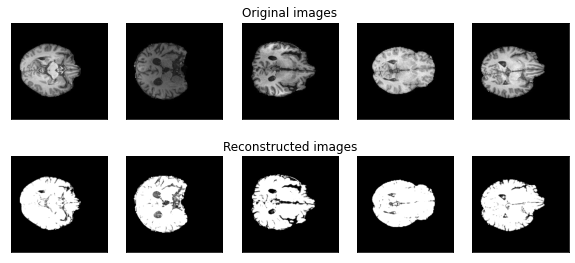


 EPOCH 148/200 	 train loss 0.45050284266471863 	 val loss 0.4503852427005768


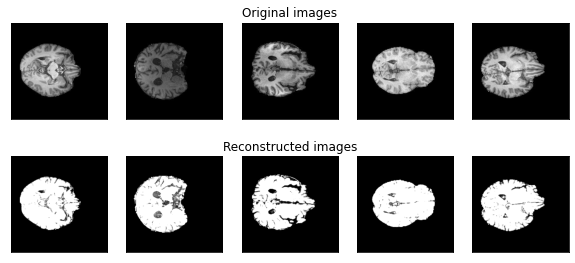


 EPOCH 149/200 	 train loss 0.4505111873149872 	 val loss 0.45037510991096497


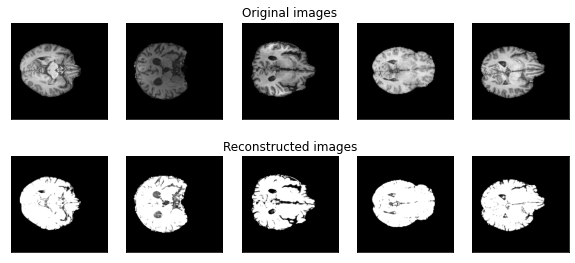


 EPOCH 150/200 	 train loss 0.4505089223384857 	 val loss 0.4503590166568756


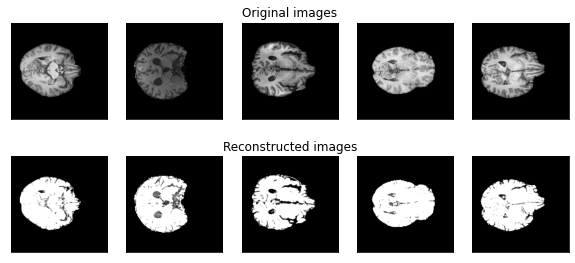


 EPOCH 151/200 	 train loss 0.45049723982810974 	 val loss 0.4503362476825714


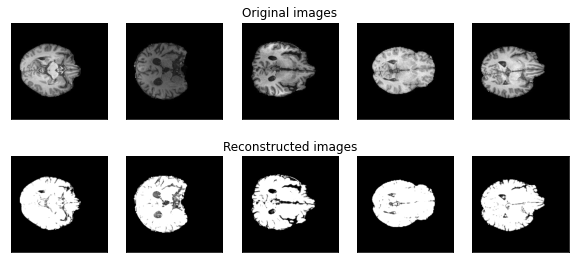


 EPOCH 152/200 	 train loss 0.4504671096801758 	 val loss 0.4503297507762909


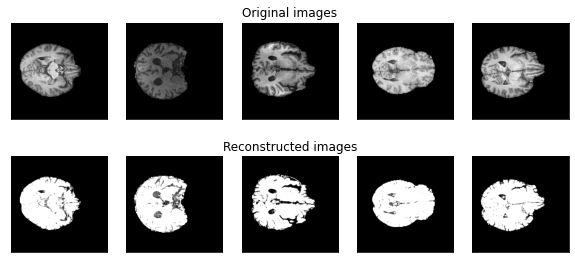


 EPOCH 153/200 	 train loss 0.45045703649520874 	 val loss 0.4503263831138611


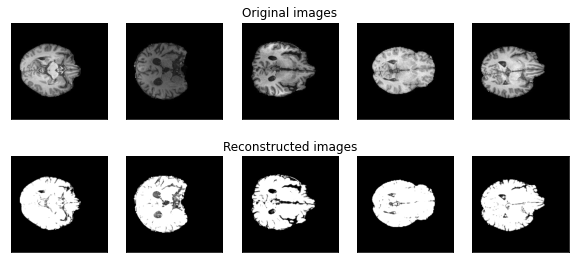


 EPOCH 154/200 	 train loss 0.45046043395996094 	 val loss 0.4503905177116394


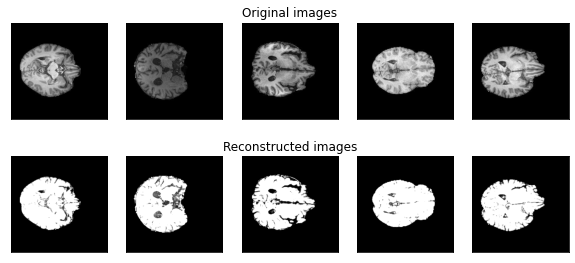


 EPOCH 155/200 	 train loss 0.45048391819000244 	 val loss 0.45040711760520935


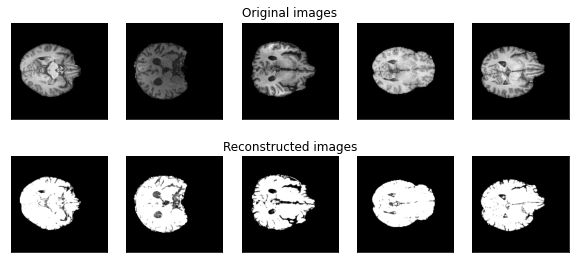


 EPOCH 156/200 	 train loss 0.450558602809906 	 val loss 0.4505123198032379


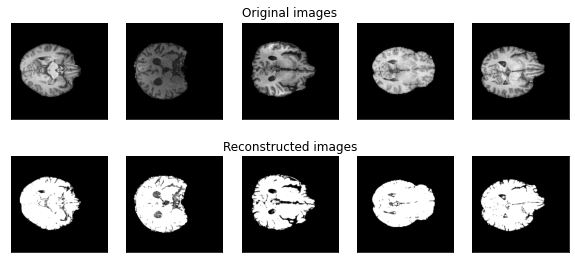


 EPOCH 157/200 	 train loss 0.45050960779190063 	 val loss 0.4503399729728699


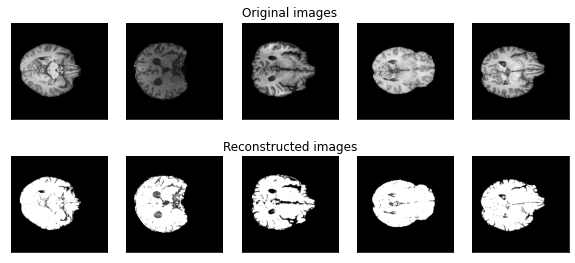


 EPOCH 158/200 	 train loss 0.450463205575943 	 val loss 0.45028209686279297


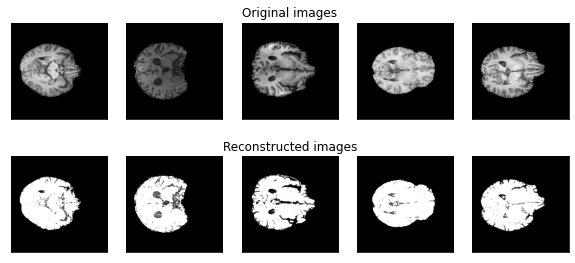


 EPOCH 159/200 	 train loss 0.4504487216472626 	 val loss 0.45026668906211853


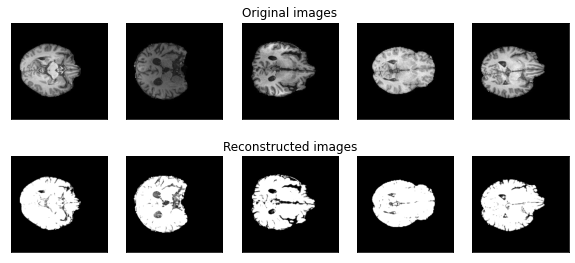


 EPOCH 160/200 	 train loss 0.4504190683364868 	 val loss 0.4502510130405426


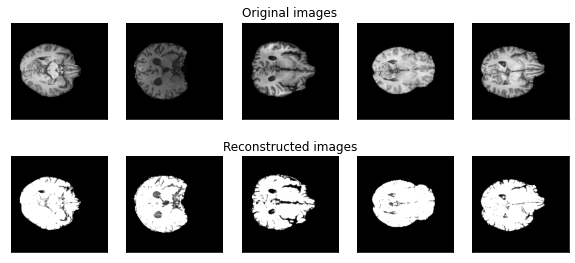


 EPOCH 161/200 	 train loss 0.45039328932762146 	 val loss 0.45024341344833374


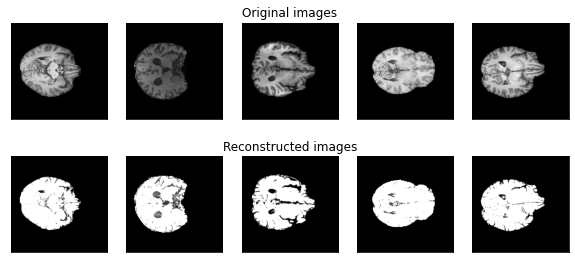


 EPOCH 162/200 	 train loss 0.4503837525844574 	 val loss 0.4502420723438263


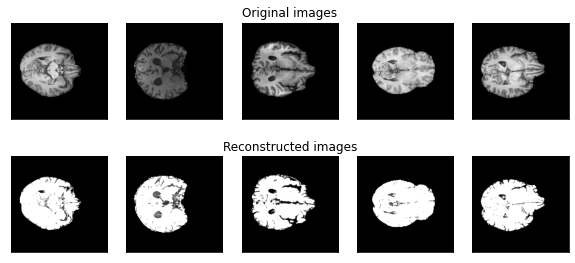


 EPOCH 163/200 	 train loss 0.45034658908843994 	 val loss 0.45024827122688293


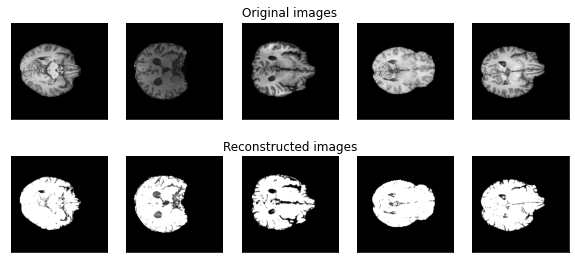


 EPOCH 164/200 	 train loss 0.45034822821617126 	 val loss 0.45024552941322327


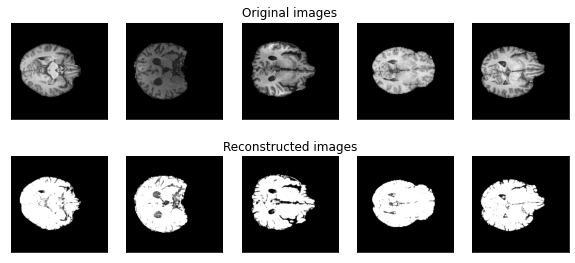


 EPOCH 165/200 	 train loss 0.4503823518753052 	 val loss 0.45024073123931885


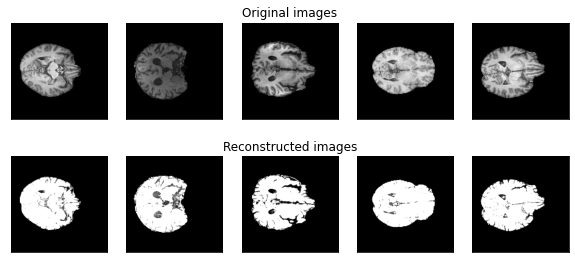


 EPOCH 166/200 	 train loss 0.4503729045391083 	 val loss 0.45023971796035767


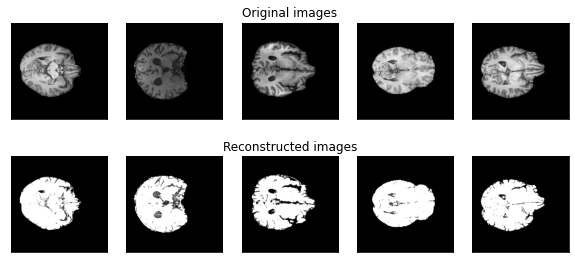


 EPOCH 167/200 	 train loss 0.4503382742404938 	 val loss 0.4502217173576355


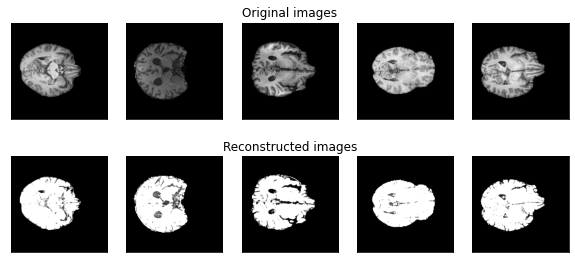


 EPOCH 168/200 	 train loss 0.45038050413131714 	 val loss 0.45022886991500854


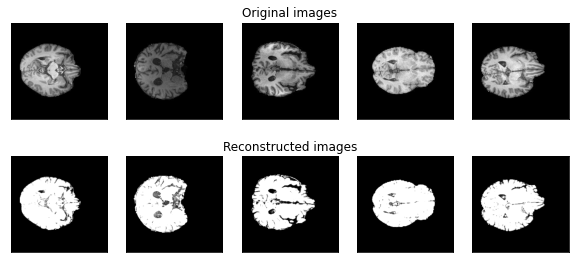


 EPOCH 169/200 	 train loss 0.45036062598228455 	 val loss 0.4502072036266327


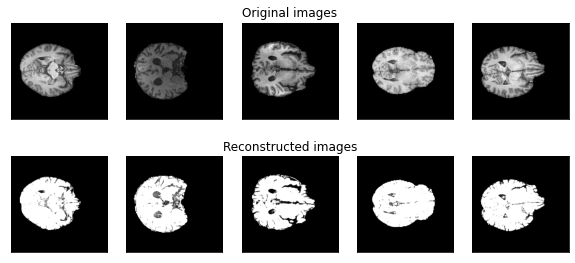


 EPOCH 170/200 	 train loss 0.4503253400325775 	 val loss 0.45019829273223877


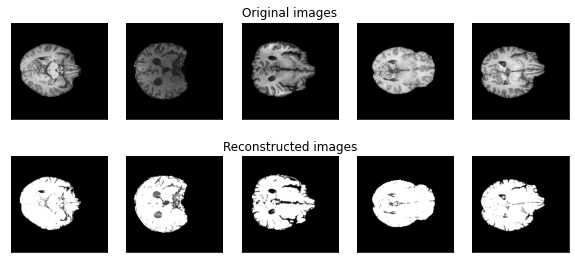


 EPOCH 171/200 	 train loss 0.4503006935119629 	 val loss 0.4501899182796478


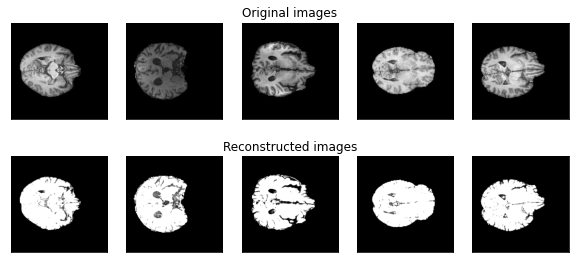


 EPOCH 172/200 	 train loss 0.45033740997314453 	 val loss 0.4501815438270569


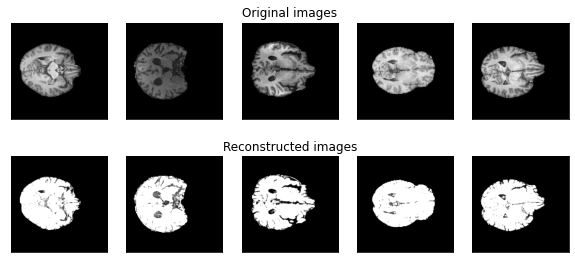


 EPOCH 173/200 	 train loss 0.4502953588962555 	 val loss 0.45015832781791687


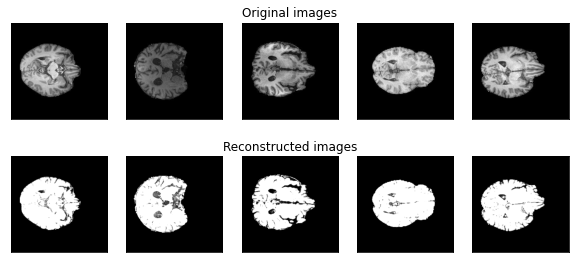


 EPOCH 174/200 	 train loss 0.4502941071987152 	 val loss 0.4501746892929077


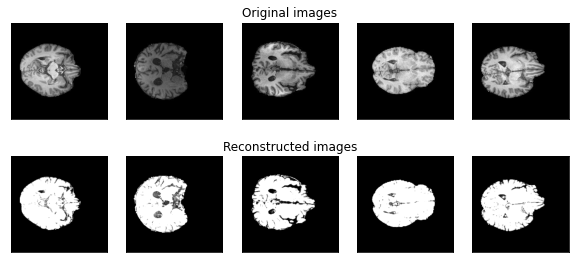


 EPOCH 175/200 	 train loss 0.4502601623535156 	 val loss 0.4501652121543884


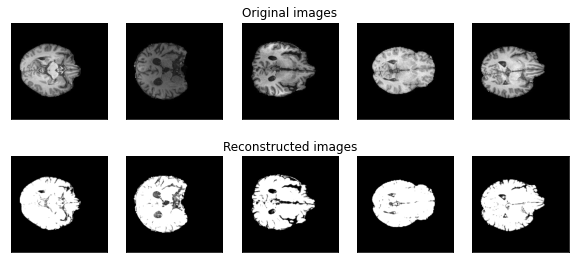


 EPOCH 176/200 	 train loss 0.4503019452095032 	 val loss 0.4502217471599579


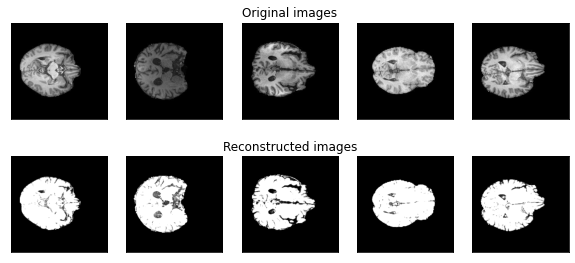


 EPOCH 177/200 	 train loss 0.45392945408821106 	 val loss 0.46001410484313965


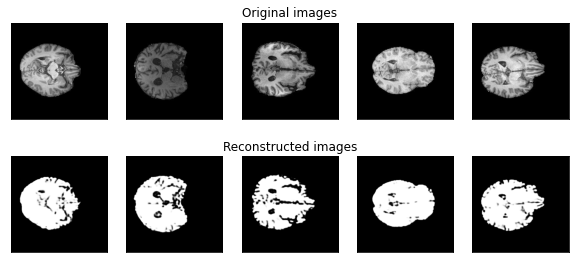


 EPOCH 178/200 	 train loss 0.4586772322654724 	 val loss 0.455000102519989


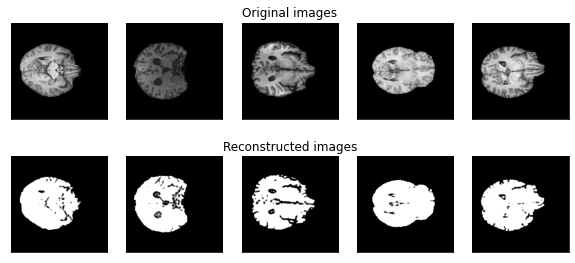


 EPOCH 179/200 	 train loss 0.45474544167518616 	 val loss 0.4534313678741455


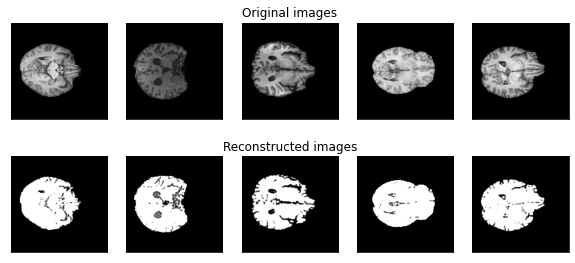


 EPOCH 180/200 	 train loss 0.4535113275051117 	 val loss 0.452610582113266


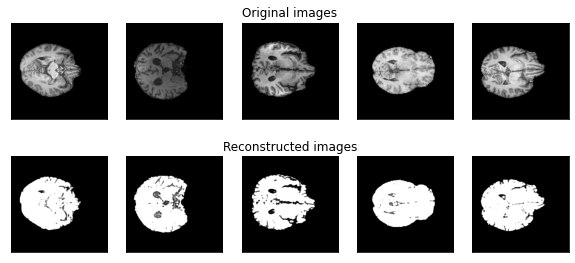


 EPOCH 181/200 	 train loss 0.4528285562992096 	 val loss 0.4521283209323883


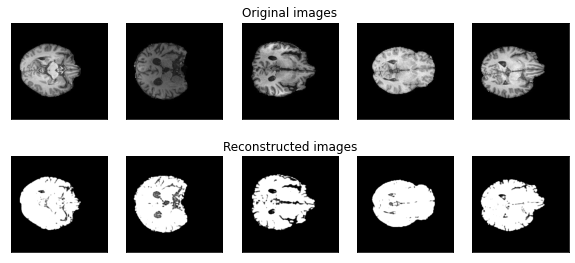


 EPOCH 182/200 	 train loss 0.45242446660995483 	 val loss 0.4522453546524048


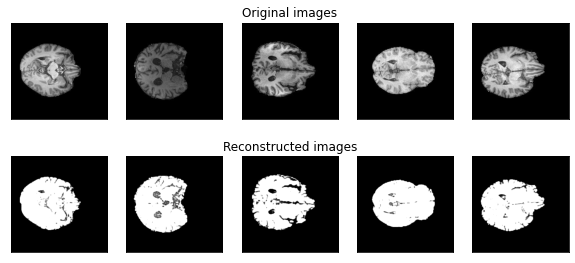


 EPOCH 183/200 	 train loss 0.4521036744117737 	 val loss 0.45171472430229187


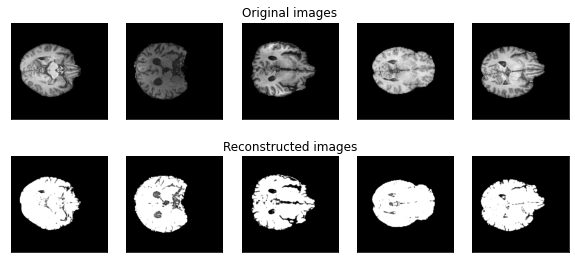


 EPOCH 184/200 	 train loss 0.4518803656101227 	 val loss 0.4515000581741333


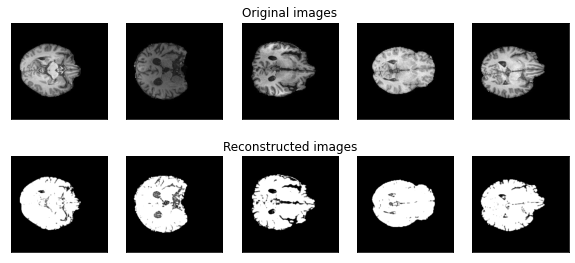


 EPOCH 185/200 	 train loss 0.4517494738101959 	 val loss 0.45140159130096436


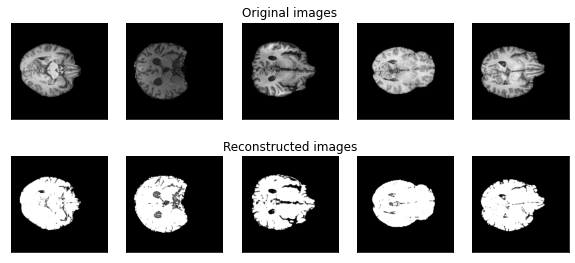


 EPOCH 186/200 	 train loss 0.45164021849632263 	 val loss 0.45144930481910706


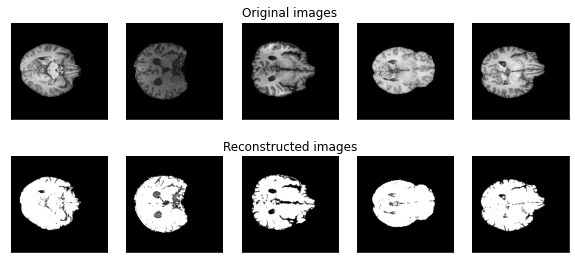


 EPOCH 187/200 	 train loss 0.4515708386898041 	 val loss 0.4512330889701843


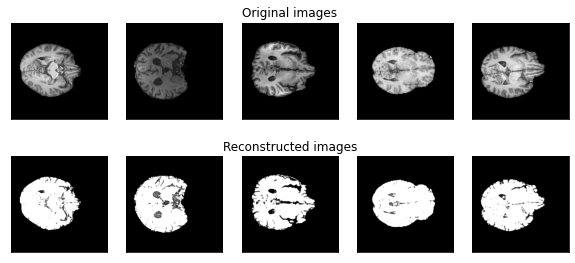


 EPOCH 188/200 	 train loss 0.45145466923713684 	 val loss 0.4511754512786865


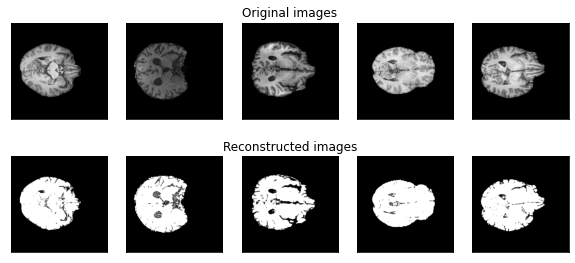


 EPOCH 189/200 	 train loss 0.45140793919563293 	 val loss 0.4511300325393677


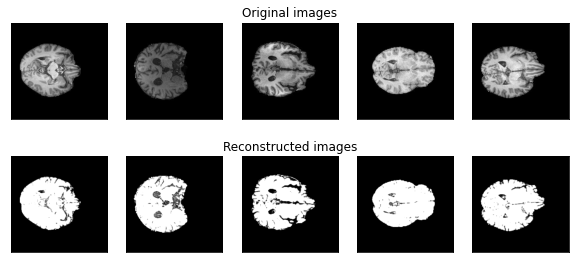


 EPOCH 190/200 	 train loss 0.451348215341568 	 val loss 0.4511309862136841


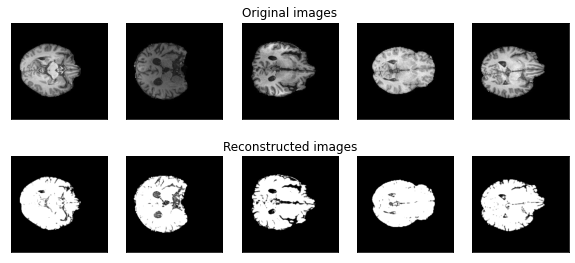


 EPOCH 191/200 	 train loss 0.45131757855415344 	 val loss 0.45108360052108765


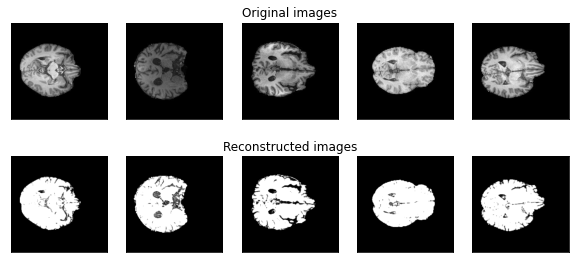


 EPOCH 192/200 	 train loss 0.4512978792190552 	 val loss 0.45110151171684265


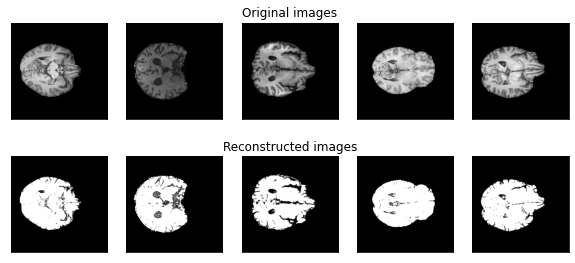


 EPOCH 193/200 	 train loss 0.45125311613082886 	 val loss 0.4510599672794342


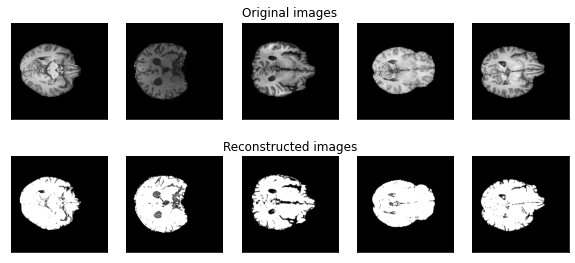


 EPOCH 194/200 	 train loss 0.4512181580066681 	 val loss 0.45097631216049194


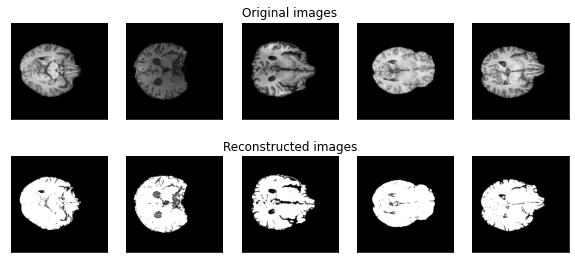


 EPOCH 195/200 	 train loss 0.45120134949684143 	 val loss 0.4510616362094879


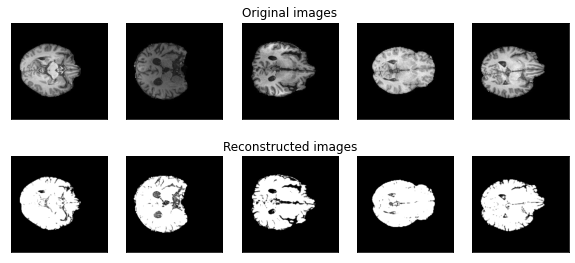


 EPOCH 196/200 	 train loss 0.45116573572158813 	 val loss 0.45097240805625916


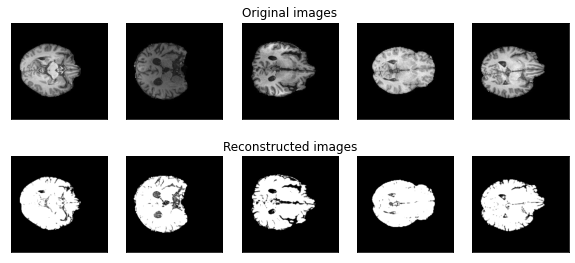


 EPOCH 197/200 	 train loss 0.45113521814346313 	 val loss 0.4509873688220978


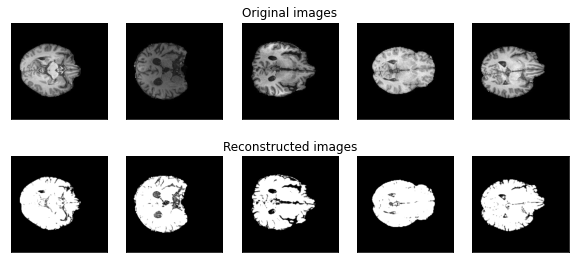


 EPOCH 198/200 	 train loss 0.4510781466960907 	 val loss 0.45104190707206726


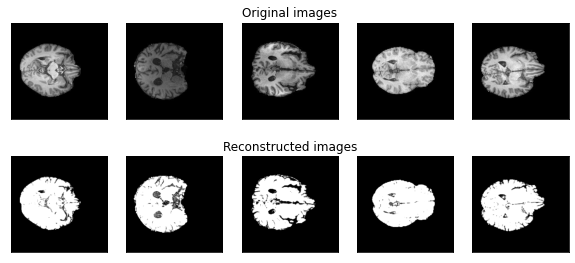


 EPOCH 199/200 	 train loss 0.4510480463504791 	 val loss 0.4509657621383667


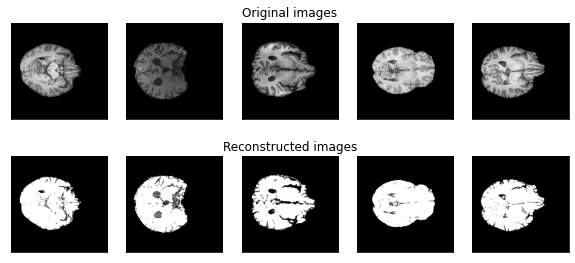


 EPOCH 200/200 	 train loss 0.4510049521923065 	 val loss 0.45083653926849365


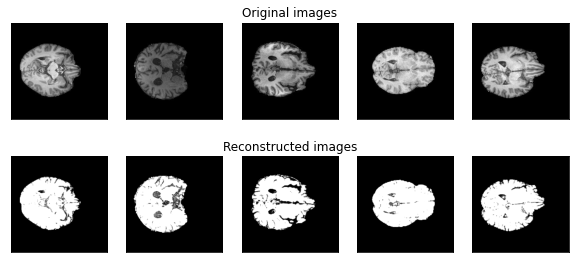

In [10]:
num_epochs = 200
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
    train_loss =train_epoch(encoder,decoder,device,data_loader,loss_fn,optim)
    val_loss = test_epoch(encoder,decoder,device,data_loader,loss_fn)
    print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
    diz_loss['train_loss'].append(train_loss)
    diz_loss['val_loss'].append(val_loss)
    plot_ae_outputs(encoder,decoder,n=5)

In [ ]:
img_shape = []
after_padding = []
for item in dataset:
    img = np.asarray(Image.open(item['image_path']))
    img_shape.append(img.shape)
    after_padding.append(padding_to_ideal_shape(img).shape)


In [ ]:
set(after_padding)

In [ ]:
len(set(img_shape))
print(set(img_shape))

In [ ]:
jpeg_folder = '/w/246/gzk/PPMI/T1_PD_clustring'
img_lists = os.listdir(jpeg_folder)

img_shape = []
for img in img_lists:
    img = np.asarray(Image.open(os.path.join(jpeg_folder, img)))
    if img.shape[1] == 256:
        img_shape.append(img.shape)

In [ ]:
print(len(set(img_shape)), len(img_shape))